Archivo 'Computodef_Propuesta.xlsx' cargado exitosamente.
Columnas del DataFrame limpias:
['fecha_compra', 'vencimiento_garantia', 'valor_del_activo', 'costo_del_activo', 'cedula', 'nombre', 'serial', 'ubicacion', 'marca', 'referencia', 'memoria', 'hdd', 'tipo_hdd', 'procesador', 'velocidad_proc.', 'estado', 'fecha_baja', 'hoja_de_vida', 'repotenciado', 'costo_acumulado_repotenciación', 'valor_después_de_depreciación', 'valor_depreciado_acumulado', 'año', 'tipo_equipo', 'horas_de_uso_acumuladas', 'nivel_de_uso_diario/semanal', 'número_de_usuarios_asignados', 'número_total_de_mantenimientos', 'fecha_del_último_mantenimiento', 'costo_total_de_mantenimiento', 'tipo_de_mantenimiento_más_frecuente', 'tiempo_promedio_entre_mantenimientos', 'ubicación_geográfica_detallada', 'condiciones_ambientales', 'riesgos_ambientales', 'fecha_de_falla_crítica', 'tiempo_fuera_de_servicio_acumulado', 'reemplazo_programado', 'tiempo_restante_de_garantía', 'tiempo_en_uso_antes_de_baja'] 

Filas restantes desp

,costo_total_de_mantenimiento,tiempo_uso_years,costo_anual_mantenimiento
0,4797100,1.941136,2.471285e+06
1,336339,6.395619,5.258896e+04
2,941476,3.479808,2.705540e+05
3,460050,9.221081,4.989111e+04
4,4811670,2.984257,1.612351e+06


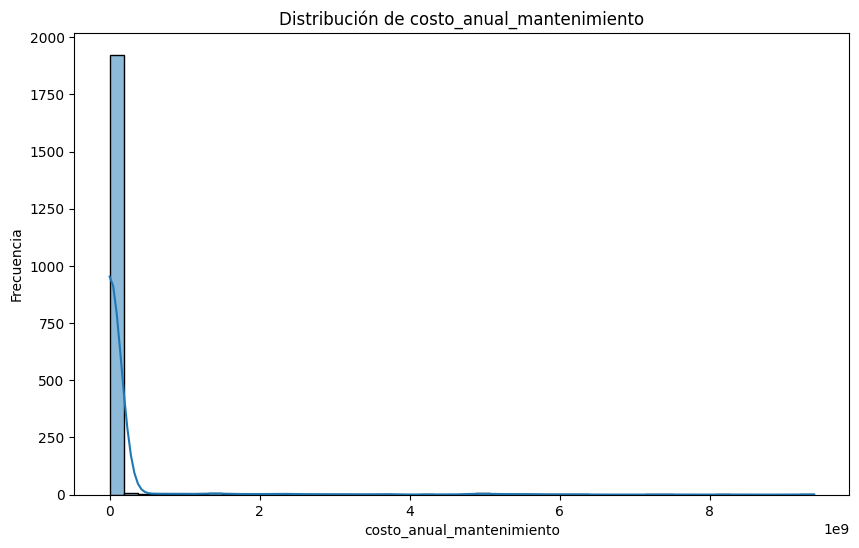


Estadísticas descriptivas para costo_anual_mantenimiento:


,costo_anual_mantenimiento
count,2.000000e+03
mean,1.108261e+08
std,6.920205e+08
min,0.000000e+00
25%,3.567690e+05
50%,8.444287e+05
75%,1.978869e+06
max,9.393163e+09



Características numéricas consideradas para el modelo:
['valor_del_activo', 'costo_del_activo', 'cedula', 'costo_acumulado_repotenciación', 'valor_después_de_depreciación', 'valor_depreciado_acumulado', 'año', 'horas_de_uso_acumuladas', 'nivel_de_uso_diario/semanal', 'número_de_usuarios_asignados', 'número_total_de_mantenimientos', 'tiempo_promedio_entre_mantenimientos', 'tiempo_fuera_de_servicio_acumulado', 'tiempo_restante_de_garantía', 'tiempo_en_uso_antes_de_baja', 'tiempo_uso_years']

Características categóricas consideradas para el modelo:
['ubicacion', 'marca', 'referencia', 'memoria', 'hdd', 'tipo_hdd', 'procesador', 'velocidad_proc.', 'estado', 'hoja_de_vida', 'tipo_equipo', 'tipo_de_mantenimiento_más_frecuente', 'ubicación_geográfica_detallada', 'condiciones_ambientales', 'riesgos_ambientales']

Data types in the feature DataFrame (X) before preprocessing:
valor_del_activo                          int64
costo_del_activo                          int64
cedula                  

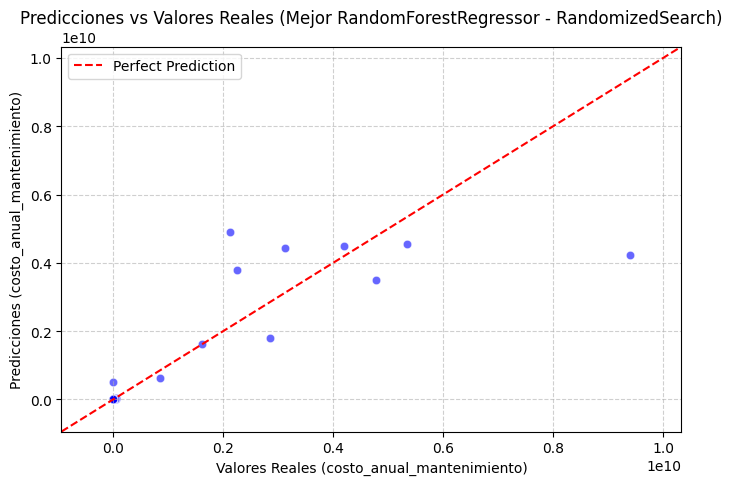

<ipython-input-7-880696790f07>:367: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=feature_importances_df, palette='viridis')


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, RandomizedSearchCV # Cambiado a RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from IPython.display import display
# Importar distribuciones si quieres usar RandomizedSearchCV con rangos continuos
# from scipy.stats import randint, uniform


# Nombre del archivo Excel
excel_file_name = 'Computodef_Propuesta.xlsx'

# Define the target variable
target_raw_col = "Costo total de mantenimiento" # Original column name before cleaning
target_col = "costo_anual_mantenimiento"     # Calculated target column name

# 1. Cargar los datos
df = None # Initialize df to None
try:
    df = pd.read_excel(excel_file_name, engine='openpyxl')
    print(f"Archivo '{excel_file_name}' cargado exitosamente.")
except FileNotFoundError:
    print(f"Error: Archivo '{excel_file_name}' no encontrado. Asegúrate de que el archivo esté en el directorio correcto de Colab.")
except Exception as e:
    print(f"Error al cargar o leer el archivo '{excel_file_name}': {e}")

# Check if the DataFrame was loaded successfully
if df is not None:
    # Convertir nombres de columnas a un formato consistente (minúsculas y sin espacios)
    df.columns = df.columns.str.strip().str.replace(' ', '_').str.lower()
    print("Columnas del DataFrame limpias:")
    print(df.columns.tolist(), "\n")

    # 2. Calcular la variable objetivo (costo_anual_mantenimiento)
    # Check if cleaned name of the raw target column exists
    cleaned_target_raw_col = target_raw_col.lower().replace(' ', '_')
    if cleaned_target_raw_col in df.columns:
        # Convert raw maintenance cost to numeric
        df[cleaned_target_raw_col] = pd.to_numeric(df[cleaned_target_raw_col], errors="coerce")

        # Convert date columns needed for time_in_use calculation
        date_purchase_col = "fecha_compra"
        date_disposal_col = "fecha_baja"

        if date_purchase_col in df.columns:
            df[date_purchase_col] = pd.to_datetime(df[date_purchase_col], errors="coerce")
        else:
            print(f"Error: La columna '{date_purchase_col}' no se encontró. No se puede calcular el tiempo de uso.")
            df = None # Indicate that processing cannot continue
        if date_disposal_col in df.columns:
            df[date_disposal_col] = pd.to_datetime(df[date_disposal_col], errors="coerce")
        else:
            print(f"La columna '{date_disposal_col}' no se encontró. Se creará con valores nulos.")
            df[date_disposal_col] = pd.NaT # Create the column with NaT if it doesn't exist

        if df is not None: # Only proceed if purchase date was found
            # Calcular el tiempo de uso en años
            today = pd.Timestamp.today()
            # Ensure date_purchase_col and date_disposal_col are datetime objects before calculation
            # This step is redundant if the previous to_datetime was successful, but adds robustness
            df[date_purchase_col] = pd.to_datetime(df[date_purchase_col], errors='coerce')
            df[date_disposal_col] = pd.to_datetime(df[date_disposal_col], errors='coerce')


            # Calculate time in use, handling potential NaTs correctly
            # (Subtracting NaT from a date results in NaT)
            time_diff = df[date_disposal_col].fillna(today) - df[date_purchase_col]
            df["tiempo_uso_years"] = time_diff.dt.days / 365.25

             # Ensure non-negative time, setting negative values (if any, though unexpected with fillna(today)) to 0
            df["tiempo_uso_years"] = df["tiempo_uso_years"].apply(lambda x: max(x, 0) if pd.notna(x) else 0)

            # Replace very small values with a minimum positive value to avoid division by zero/near zero
            # Using a slightly larger epsilon
            df["tiempo_uso_years"] = df["tiempo_uso_years"].mask(df["tiempo_uso_years"] < 1e-3, 1e-3) # Increased epsilon


            # Calculate the target variable
            df[target_col] = df[cleaned_target_raw_col] / df["tiempo_uso_years"]

            # Handle potential infinite values resulting from division
            df[target_col] = df[target_col].replace([np.inf, -np.inf], np.nan)

            # Drop rows where the target variable is NaN
            df.dropna(subset=[target_col], inplace=True)
            print(f"Filas restantes después de calcular y eliminar NaNs en '{target_col}': {len(df)}")

            print(f"\nEjemplo de '{cleaned_target_raw_col}', 'tiempo_uso_years' y '{target_col}':")
            display(df[[cleaned_target_raw_col, "tiempo_uso_years", target_col]].head())

            # --- Data Exploration: Visualize the target variable ---
            if target_col in df.columns and len(df) > 0:
                plt.figure(figsize=(10, 6))
                sns.histplot(df[target_col], bins=50, kde=True)
                plt.title(f"Distribución de {target_col}")
                plt.xlabel(target_col)
                plt.ylabel("Frecuencia")
                plt.show()

                print(f"\nEstadísticas descriptivas para {target_col}:")
                display(df[target_col].describe())

            # --- End of Data Exploration ---


        else:
            print(f"La columna '{date_purchase_col}' no se encontró. No se pudo calcular el tiempo de uso y continuar con el procesamiento.")
            df = None # Explicitly set df to None if purchase date column is missing

    else:
        print(f"La columna original de costo total de mantenimiento ('{target_raw_col}') no se encontró en el DataFrame.")
        df = None # Indicate that processing cannot continue


# Proceed with modeling only if DataFrame and target were successfully prepared and not empty
if df is not None and target_col in df.columns and len(df) > 0:

    # 3. Seleccionar Características (X) y Variable Objetivo (y)
    # Identify numeric features to use as predictors (excluding the target and columns used to derive it)
    # Include ordinal date columns and tiempo_uso_years as potential numeric predictors
    numeric_features_to_consider = df.select_dtypes(include=[np.number]).columns.tolist()
    # Exclude the target, the raw target, and columns used to derive it if they are not intended as predictors
    cols_to_exclude_from_numeric_predictors = [target_col, cleaned_target_raw_col] # Also exclude raw cost

    # Decide if 'tiempo_uso_years' should be a predictor. It's often a strong predictor for maintenance costs.
    # If you want to include it as a predictor, remove it from cols_to_exclude_from_numeric_predictors
    # For now, let's include it as a predictor as it's likely relevant.
    if "tiempo_uso_years" in cols_to_exclude_from_numeric_predictors:
         cols_to_exclude_from_numeric_predictors.remove("tiempo_uso_years")


    numeric_features_to_consider = [col for col in numeric_features_to_consider if col not in cols_to_exclude_from_numeric_predictors]


    # Identify categorical features to use as predictors
    categorical_features_to_consider = df.select_dtypes(include=['object', 'category']).columns.tolist()
    # Exclude any categorical columns that shouldn't be predictors (e.g., identifiers)
    cols_to_exclude_from_categorical_predictors = ['serial', 'cedula', 'nombre']
    categorical_features_to_consider = [col for col in categorical_features_to_consider if col not in cols_to_exclude_from_categorical_predictors]

    print("\nCaracterísticas numéricas consideradas para el modelo:")
    print(numeric_features_to_consider)
    print("\nCaracterísticas categóricas consideradas para el modelo:")
    print(categorical_features_to_consider)


    # Define the final list of features to be used in the model X
    # This should be the union of numeric and categorical features considered
    all_features_for_model = numeric_features_to_consider + categorical_features_to_consider

    # Select the features and target
    # Only select columns that actually exist in the DataFrame
    all_features_for_model_existing = [col for col in all_features_for_model if col in df.columns]

    if not all_features_for_model_existing:
        print("\nError: No hay características válidas seleccionadas para el modelo.")
    else:
        X = df[all_features_for_model_existing].copy() # Use .copy() to avoid SettingWithCopyWarning
        y = df[target_col].copy() # Use .copy()

        # Verify the data types in X before preprocessing
        print("\nData types in the feature DataFrame (X) before preprocessing:")
        print(X.dtypes)
        print("\nSample of target variable (y):")
        print(y.head())


        # 4. Preprocesamiento
        # Ensure the final numeric and categorical features lists for the preprocessor
        # only contain columns present in the selected X DataFrame.
        # Also, ensure they are handled correctly by filling NaNs before passing to transformers

        # Re-filter numeric and categorical features based on columns actually present in X
        numeric_features_in_X = [col for col in numeric_features_to_consider if col in X.columns]
        categorical_features_in_X = [col for col in categorical_features_to_consider if col in X.columns]

        # Fill NaNs in numeric features in X BEFORE scaling
        # Using median for numeric imputation
        for col in numeric_features_in_X:
            if pd.api.types.is_numeric_dtype(X[col]):
                 X[col] = X[col].fillna(X[col].median())
            else:
                 print(f"Advertencia: La columna '{col}' se esperaba numérica pero no lo es. Se omitirá la imputación numérica.")


        # Fill NaNs in categorical features in X BEFORE one-hot encoding
        # Fill with 'Unknown' and ensure string type
        for col in categorical_features_in_X:
             X[col] = X[col].astype(str).fillna('Unknown') # Fill with 'Unknown' and ensure string type

        # Create transformers for numerical and categorical features
        # Imputation moved before scaling and encoding for better control
        numeric_transformer = StandardScaler() # StandardScaler is still useful for Random Forests, although not strictly necessary
        categorical_transformer = OneHotEncoder(handle_unknown='ignore') # handle_unknown='ignore' is useful for new categories in test set

        # Create a list of tuples for the preprocessor transformers
        transformers = []
        if numeric_features_in_X:
            transformers.append(('num', numeric_transformer, numeric_features_in_X))
        if categorical_features_in_X:
            transformers.append(('cat', categorical_transformer, categorical_features_in_X))

        # Create a preprocessor that applies the transformers
        # Explicitly drop columns not specified
        preprocessor = ColumnTransformer(
            transformers=transformers,
            remainder='drop' # Explicitly drop columns not specified
        )

        # Create the pipeline with the preprocessor and the regressor
        pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                 ('regressor', RandomForestRegressor(random_state=42, n_jobs=-1))]) # Regressor without specific hyperparameters yet


        # 5. Dividir los datos
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # 6. Definir el espacio de hiperparámetros para RandomizedSearchCV
        # Usamos un espacio más amplio, similar a la cuadrícula original, o incluso un poco más
        param_distributions = {
            'regressor__n_estimators': [50, 100, 150, 200, 250], # Rango más amplio de árboles
            'regressor__max_depth': [5, 10, 15, 20, None],      # Rango más amplio de profundidades
            'regressor__min_samples_split': [2, 5, 10, 15],      # Rango más amplio
            'regressor__min_samples_leaf': [1, 2, 4, 8]         # Rango más amplio
        }


        # 7. Configurar y ejecutar RandomizedSearchCV
        print("\nIniciando RandomizedSearchCV para encontrar los mejores hiperparámetros...")
        # El bloque try...except ahora envuelve el RandomizedSearchCV y la evaluación
        try:
            # Especificamos n_iter: el número de combinaciones aleatorias a probar.
            # Puedes ajustar este número. Un valor más alto explorará más, pero tardará más.
            # Empecemos con 50, por ejemplo.
            random_search = RandomizedSearchCV(pipeline, param_distributions, n_iter=50,
                                       cv=5, # Usar validación cruzada de 5 pliegues
                                       scoring='neg_mean_squared_error',
                                       random_state=42, # Para resultados reproducibles
                                       n_jobs=-1, verbose=2) # Added verbose for progress updates

            random_search.fit(X_train, y_train)

            # 8. Obtener el mejor modelo y los mejores hiperparámetros
            best_model = random_search.best_estimator_ # Usamos random_search.best_estimator_
            best_params = random_search.best_params_   # Usamos random_search.best_params_
            best_score = random_search.best_score_     # Usamos random_search.best_score_ (MSE negativo medio)

            print("\n=== Resultados de RandomizedSearchCV ===")
            print(f"Mejores hiperparámetros encontrados (muestra aleatoria): {best_params}")
            # El mejor score es MSE negativo, convertimos a MSE positivo
            print(f"Mejor score de validación cruzada (MSE): {-best_score:.4f}")


            # 9. Evaluar el mejor modelo en el conjunto de prueba
            print("\nEvaluando el mejor modelo en el conjunto de prueba...")
            y_pred = best_model.predict(X_test)

            # Ensure y_test and y_pred are numeric before calculating metrics
            # y_test is already a pandas Series, pd.to_numeric will convert it
            y_test_numeric = pd.to_numeric(y_test, errors='coerce')

            # y_pred is a numpy array, convert it to pandas Series for easier NaN handling
            y_pred_series = pd.Series(y_pred, index=y_test.index) # Keep original index for alignment
            y_pred_numeric = pd.to_numeric(y_pred_series, errors='coerce')


            # Identify valid indices where neither y_test_numeric nor y_pred_numeric are NaN
            valid_indices = y_test_numeric.index[y_test_numeric.notna() & y_pred_numeric.notna()]


            # Filter both y_test_numeric and y_pred_numeric using the valid indices
            y_test_numeric_filtered = y_test_numeric.loc[valid_indices]
            y_pred_numeric_filtered = y_pred_numeric.loc[valid_indices]


            if not y_test_numeric_filtered.empty and not y_pred_numeric_filtered.empty:
                # Calcular métricas de evaluación para el conjunto de prueba
                mse_test = mean_squared_error(y_test_numeric_filtered, y_pred_numeric_filtered)
                rmse_test = np.sqrt(mse_test)
                r2_test = r2_score(y_test_numeric_filtered, y_pred_numeric_filtered)

                # Print the evaluation metrics
                print("\n=== Resultados de Evaluación del Mejor Modelo (RandomizedSearch) en Conjunto de Prueba ===") # Título actualizado
                print(f"Error cuadrático medio (MSE): {mse_test:.4f}")
                print(f"Raíz del error cuadrático medio (RMSE): {rmse_test:.4f}")
                print(f"Coeficiente de determinación (R^2): {r2_test:.4f}")


                # 10. Visualizar resultados (usando el mejor modelo)
                plt.figure(figsize=(8, 5))
                sns.scatterplot(x=y_test_numeric_filtered, y=y_pred_numeric_filtered, color="blue", alpha=0.6)
                min_val = min(y_test_numeric_filtered.min(), y_pred_numeric_filtered.min()) if not y_test_numeric_filtered.empty and not y_pred_numeric_filtered.empty else 0
                max_val = max(y_test_numeric_filtered.max(), y_pred_numeric_filtered.max()) if not y_test_numeric_filtered.empty and not y_pred_numeric_filtered.empty else 1

                range_val = max_val - min_val
                padding = range_val * 0.1 # 10% padding
                plot_min = min_val - padding
                plot_max = max_val + padding

                plt.plot([plot_min, plot_max], [plot_min, plot_max], color="red", ls="--", label='Perfect Prediction')
                plt.xlim([plot_min, plot_max])
                plt.ylim([plot_min, plot_max])

                plt.title("Predicciones vs Valores Reales (Mejor RandomForestRegressor - RandomizedSearch)") # Título actualizado
                plt.xlabel(f"Valores Reales ({target_col})")
                plt.ylabel(f"Predicciones ({target_col})")
                plt.legend()
                plt.grid(True, linestyle='--', alpha=0.6)
                plt.show()

                # Display feature importance for the best RandomForest (using feature_importances_)
                # Need to get feature names after one-hot encoding
                # Get the fitted preprocessor from the best pipeline
                fitted_preprocessor = best_model.named_steps['preprocessor']

                # Get the feature names out from the preprocessor
                feature_names_transformed = []
                try:
                     # Pass X_train here to ensure fit is complete and get_feature_names_out works
                     fitted_preprocessor.fit(X_train) # Ensure preprocessor is fitted before getting names
                     feature_names_transformed = fitted_preprocessor.get_feature_names_out(X_train.columns)
                except AttributeError:
                     # Fallback for older versions - requires more manual handling
                     print("Advertencia: get_feature_names_out no disponible. Intentando obtener nombres de características manualmente.")
                     # Attempt to get names from numeric transformer (identity for names)
                     if numeric_features_in_X:
                          feature_names_transformed.extend(numeric_features_in_X)

                     # Attempt to get names from OHE transformer
                     if categorical_features_in_X:
                          categorical_transformer_fitted = fitted_preprocessor.named_transformers_['cat']
                          if hasattr(categorical_transformer_fitted, 'get_feature_names'):
                              try:
                                  categorical_names = list(categorical_transformer_fitted.get_feature_names(input_features=categorical_features_in_X))
                              except TypeError:
                                  categorical_names = list(categorical_transformer_fitted.get_feature_names())
                              feature_names_transformed.extend(categorical_names)
                          else:
                              try:
                                  temp_transformed_full = fitted_preprocessor.transform(X_train)
                                  num_numeric_cols_out = fitted_preprocessor.transformers_[0][1].transform(X_train[numeric_features_in_X]).shape[1] if numeric_features_in_X else 0
                                  temp_transformed_cat_part = temp_transformed_full[:, num_numeric_cols_out:]
                                  num_cat_features_out = temp_transformed_cat_part.shape[1]
                                  feature_names_transformed.extend([f'cat_{i}' for i in range(num_cat_features_out)])
                              except Exception as transform_error:
                                  print(f"Error obtaining shape of transformed categorical features: {transform_error}")
                                  pass

            if feature_names_transformed is not None and len(feature_names_transformed) > 0:
                 # Get feature importances from the best RandomForest (using feature_importances_)
                 importances = best_model.named_steps['regressor'].feature_importances_

                 # Check if the number of importances matches the number of feature names
                 if len(importances) == len(feature_names_transformed):
                     # Create DataFrame and sort importances
                     feature_importances_df = pd.DataFrame({'Feature': feature_names_transformed, 'Importance': importances})
                     feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

                     # Gráfico de importancia de características
                     plt.figure(figsize=(12, max(6, len(feature_importances_df) * 0.4)))
                     sns.barplot(x='Importance', y='Feature', data=feature_importances_df, palette='viridis')
                     plt.xlabel('Importancia (Feature Importance)')
                     plt.ylabel('Característica')
                     plt.title('Importancia de las Características (Mejor RandomForestRegressor - RandomizedSearch)') # Título actualizado
                     plt.tight_layout()
                     plt.show()
                 else:
                      print(f"\nAdvertencia: El número de importancias de las características del modelo ({len(importances)}) no coincide con el número de nombres de características transformadas ({len(feature_names_transformed)}). No se puede mostrar el gráfico de importancia de características.")
            else:
                 print("\nNo se pudieron obtener los nombres de las características transformadas para visualizar la importancia.")


            # Optional: Save the best scikit-learn model and the preprocessor
            # import joblib
            # joblib.dump(best_model, 'annual_maintenance_cost_model_rf_randomtuned.pkl')
            # print("\nMejor modelo scikit-learn guardado como 'annual_maintenance_cost_model_rf_randomtuned.pkl'")


        # The evaluation results print and plotting are inside the 'if not empty' block
        # The final except block handles errors during the try block's execution
        except Exception as e:
            print(f"\nError durante el ajuste (RandomizedSearchCV), predicción o evaluación del modelo scikit-learn: {e}") # Mensaje actualizado


else:
    print("\nNo se pudo cargar o preparar el DataFrame, el proceso de modelado no continuará.")

***CODIGO FINAL PARA ENTRENAMIENTO DEL MODELO***

Archivo 'Computodef_Propuesta.xlsx' cargado exitosamente.
Columnas del DataFrame limpias:
['fecha_compra', 'vencimiento_garantia', 'valor_del_activo', 'costo_del_activo', 'cedula', 'nombre', 'serial', 'ubicacion', 'marca', 'referencia', 'memoria', 'hdd', 'tipo_hdd', 'procesador', 'velocidad_proc.', 'estado', 'fecha_baja', 'hoja_de_vida', 'repotenciado', 'costo_acumulado_repotenciación', 'valor_después_de_depreciación', 'valor_depreciado_acumulado', 'año', 'tipo_equipo', 'horas_de_uso_acumuladas', 'nivel_de_uso_diario/semanal', 'número_de_usuarios_asignados', 'número_total_de_mantenimientos', 'fecha_del_último_mantenimiento', 'costo_total_de_mantenimiento', 'tipo_de_mantenimiento_más_frecuente', 'tiempo_promedio_entre_mantenimientos', 'ubicación_geográfica_detallada', 'condiciones_ambientales', 'riesgos_ambientales', 'fecha_de_falla_crítica', 'tiempo_fuera_de_servicio_acumulado', 'reemplazo_programado', 'tiempo_restante_de_garantía', 'tiempo_en_uso_antes_de_baja'] 

Filas restantes desp

,costo_total_de_mantenimiento,tiempo_uso_years,costo_anual_mantenimiento
0,4797100,1.941136,2.471285e+06
1,336339,6.395619,5.258896e+04
2,941476,3.479808,2.705540e+05
3,460050,9.221081,4.989111e+04
4,4811670,2.984257,1.612351e+06


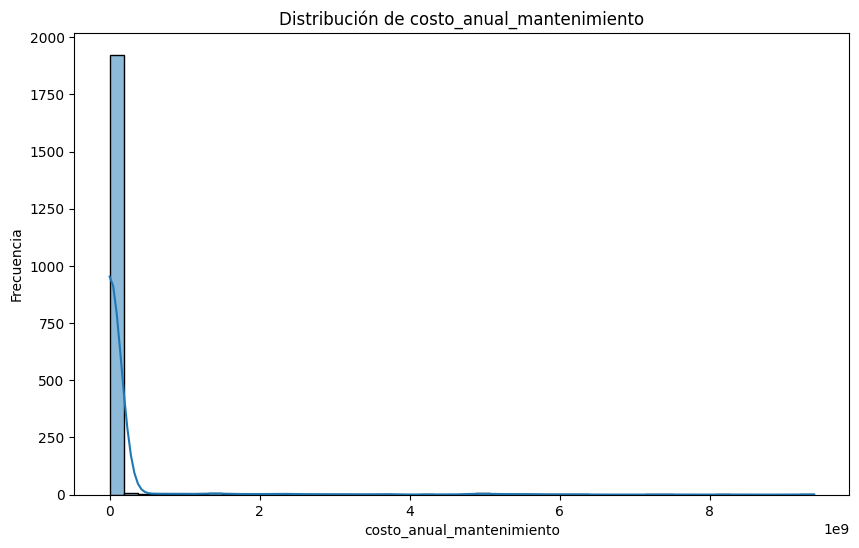


Estadísticas descriptivas para costo_anual_mantenimiento:


,costo_anual_mantenimiento
count,2.000000e+03
mean,1.108261e+08
std,6.920205e+08
min,0.000000e+00
25%,3.567690e+05
50%,8.444287e+05
75%,1.978869e+06
max,9.393163e+09



Características originales seleccionadas para el modelo final (basado en tu lista): ['tiempo_en_uso_antes_de_baja', 'tiempo_uso_years', 'número_total_de_mantenimientos', 'tipo_de_mantenimiento_más_frecuente', 'valor_depreciado_acumulado', 'cedula', 'estado']

DataFrame preparado con 7 características seleccionadas para el modelo final.

Entrenando el modelo final con características seleccionadas manualmente y los mejores hiperparámetros...
Entrenamiento del modelo final completado.

Modelo entrenado guardado como 'annual_maintenance_cost_model_final.pkl'
Puedes descargar este archivo desde el panel de Archivos de Colab (icono de carpeta a la izquierda).

Evaluando el modelo final en el conjunto de prueba filtrado...

=== Resultados de Evaluación del Modelo Final (Características Seleccionadas) ===
Error cuadrático medio (MSE): 101045507467234304.0000
Raíz del error cuadrático medio (RMSE): 317876560.1098
Coeficiente de determinación (R^2): 0.7809


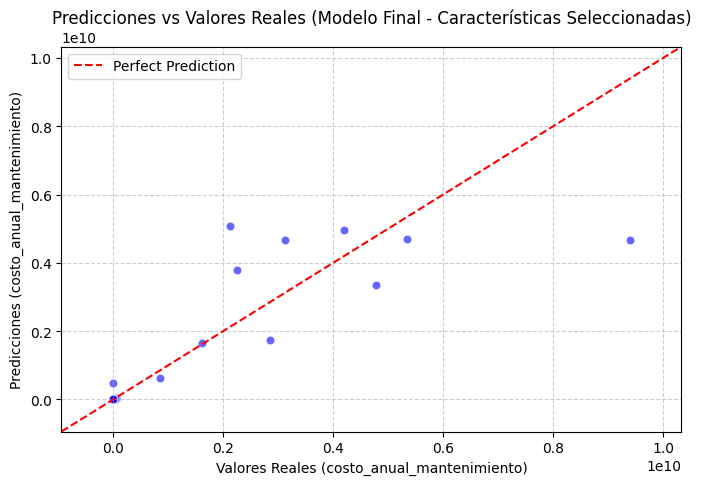

<ipython-input-13-de7d51eae843>:308: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importancia', y='Característica', data=df_importancia_caracteristicas_final, palette='viridis')


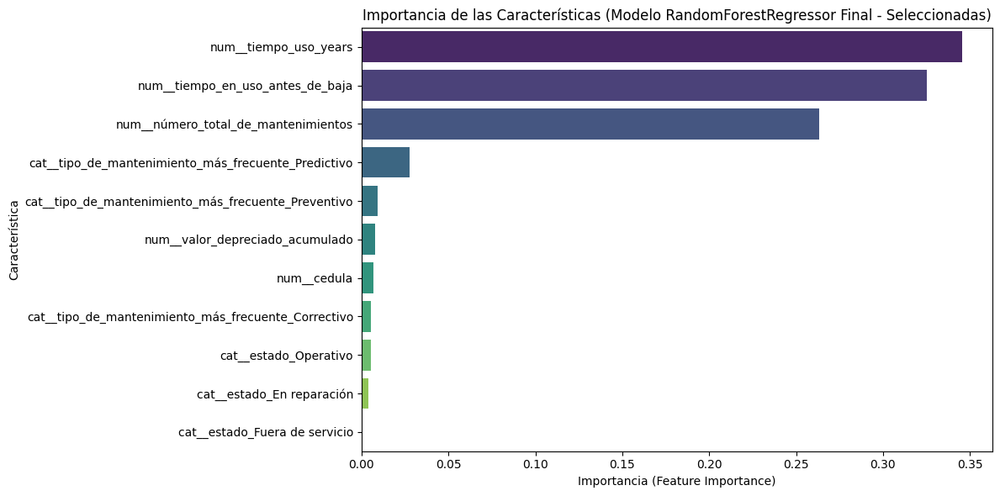

In [ ]:
from IPython import get_ipython
from IPython.display import display
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from IPython.display import display
import joblib # Importar joblib para guardar/cargar modelos


# Nombre del archivo Excel
excel_file_name = 'Computodef_Propuesta.xlsx'

# Define la variable objetivo
target_raw_col = "Costo total de mantenimiento" # Nombre de columna original
target_col = "costo_anual_mantenimiento"     # Nombre de columna calculado

# 1. Cargar los datos
df = None
try:
    df = pd.read_excel(excel_file_name, engine='openpyxl')
    print(f"Archivo '{excel_file_name}' cargado exitosamente.")
except FileNotFoundError:
    print(f"Error: Archivo '{excel_file_name}' no encontrado. Asegúrate de que el archivo esté en el directorio correcto de Colab.")
except Exception as e:
    print(f"Error al cargar o leer el archivo '{excel_file_name}': {e}")

# Verificar si el DataFrame se cargó exitosamente
if df is not None:
    # Convertir nombres de columnas a un formato consistente (minúsculas y sin espacios)
    df.columns = df.columns.str.strip().str.replace(' ', '_').str.lower()
    print("Columnas del DataFrame limpias:")
    print(df.columns.tolist(), "\n")

    # 2. Calcular la variable objetivo (costo_anual_mantenimiento)
    cleaned_target_raw_col = target_raw_col.lower().replace(' ', '_')
    if cleaned_target_raw_col in df.columns:
        df[cleaned_target_raw_col] = pd.to_numeric(df[cleaned_target_raw_col], errors="coerce")

        date_purchase_col = "fecha_compra"
        date_disposal_col = "fecha_baja"

        if date_purchase_col in df.columns:
            df[date_purchase_col] = pd.to_datetime(df[date_purchase_col], errors="coerce")
        else:
            print(f"Error: La columna '{date_purchase_col}' no se encontró. No se puede calcular el tiempo de uso.")
            df = None
        if date_disposal_col in df.columns:
            df[date_disposal_col] = pd.to_datetime(df[date_disposal_col], errors="coerce")
        else:
            print(f"La columna '{date_disposal_col}' no se encontró. Se creará con valores nulos.")
            df[date_disposal_col] = pd.NaT

        if df is not None:
            today = pd.Timestamp.today()
            df[date_purchase_col] = pd.to_datetime(df[date_purchase_col], errors='coerce')
            df[date_disposal_col] = pd.to_datetime(df[date_disposal_col], errors='coerce')

            time_diff = df[date_disposal_col].fillna(today) - df[date_purchase_col]
            df["tiempo_uso_years"] = time_diff.dt.days / 365.25

            df["tiempo_uso_years"] = df["tiempo_uso_years"].apply(lambda x: max(x, 0) if pd.notna(x) else 0)
            df["tiempo_uso_years"] = df["tiempo_uso_years"].mask(df["tiempo_uso_years"] < 1e-3, 1e-3)

            df[target_col] = df[cleaned_target_raw_col] / df["tiempo_uso_years"]
            df[target_col] = df[target_col].replace([np.inf, -np.inf], np.nan)
            df.dropna(subset=[target_col], inplace=True)
            print(f"Filas restantes después de calcular y eliminar NaNs en '{target_col}': {len(df)}")

            print(f"\nEjemplo de '{cleaned_target_raw_col}', 'tiempo_uso_years' y '{target_col}':")
            display(df[[cleaned_target_raw_col, "tiempo_uso_years", target_col]].head())

            if target_col in df.columns and len(df) > 0:
                plt.figure(figsize=(10, 6))
                sns.histplot(df[target_col], bins=50, kde=True)
                plt.title(f"Distribución de {target_col}")
                plt.xlabel(target_col)
                plt.ylabel("Frecuencia")
                plt.show()

                print(f"\nEstadísticas descriptivas para {target_col}:")
                display(df[target_col].describe())

        else:
            print(f"La columna '{date_purchase_col}' no se encontró. No se pudo calcular el tiempo de uso y continuar con el procesamiento.")
            df = None

    else:
        print(f"La columna original de costo total de mantenimiento ('{target_raw_col}') no se encontró en el DataFrame.")
        df = None


# Proceder con el modelado solo si el DataFrame y la variable objetivo se prepararon exitosamente y no están vacíos
if df is not None and target_col in df.columns and len(df) > 0:

    # --- DEFINIR CARACTERÍSTICAS IMPORTANTES (basado en tu análisis previo) ---
    # ACTUALIZA ESTA LISTA con los nombres exactos de las columnas originales
    # que identificaste como importantes en tu análisis de importancia de características.
    # Si una característica categórica se mostró con OHE, usa el nombre original.
    # Por ejemplo, si 'cat_tipo_de_mantenimiento_más_frecuente_Preventivo' era importante,
    # usa el nombre original 'tipo_de_mantenimiento_más_frecuente'.

    # Se realiza la lista de las caracteristicas mas importantes
    caracteristicas_originales_importantes = [
        'tiempo_en_uso_antes_de_baja',
        'tiempo_uso_years',
        'número_total_de_mantenimientos',
        'tipo_de_mantenimiento_más_frecuente',
        'valor_depreciado_acumulado',
        'cedula',
        'estado',
    ]
    print(f"\nCaracterísticas originales seleccionadas para el modelo final (basado en la lista): {caracteristicas_originales_importantes}")


    # Seleccionar las características y la variable objetivo del DataFrame original
    # Filtrar solo las columnas seleccionadas para el modelo final
    columnas_para_df_final = caracteristicas_originales_importantes + [target_col]

    # Asegurar que las columnas seleccionadas existan en el DataFrame
    columnas_para_df_final_existentes = [col for col in columnas_para_df_final if col in df.columns]

    if target_col not in columnas_para_df_final_existentes:
        print(f"Error: La columna objetivo '{target_col}' no está presente en las columnas seleccionadas para el DataFrame final.")
    elif len(columnas_para_df_final_existentes) <= 1: # Solo la columna objetivo
        print("\nError: No hay características seleccionadas válidas para el modelo final después del filtrado.")
    else:
        df_final = df[columnas_para_df_final_existentes].copy()
        print(f"\nDataFrame preparado con {len(df_final.columns) - 1} características seleccionadas para el modelo final.")


        # 3. Seleccionar Características (X) y Variable Objetivo (y) del DataFrame final
        X_final = df_final.drop(columns=[target_col]).copy()
        y_final = df_final[target_col].copy()

        # 4. Dividir los datos para el modelo final
        X_train_final, X_test_final, y_train_final, y_test_final = train_test_split(X_final, y_final, test_size=0.2, random_state=42)

        # 5. Preprocesamiento para el modelo final (solo con las características seleccionadas)
        # Identificar las características numéricas y categóricas DENTRO del DataFrame filtrado
        caracteristicas_numericas_en_X_final = X_train_final.select_dtypes(include=[np.number]).columns.tolist()
        caracteristicas_categoricas_en_X_final = X_train_final.select_dtypes(include=['object', 'category']).columns.tolist()

        # Rellenar NaNs en características numéricas (usando la mediana del entrenamiento)
        for col in caracteristicas_numericas_en_X_final:
            if pd.api.types.is_numeric_dtype(X_train_final[col]):
                mediana_val = X_train_final[col].median()
                X_train_final[col] = X_train_final[col].fillna(mediana_val)
                X_test_final[col] = X_test_final[col].fillna(mediana_val)

        # Rellenar NaNs en características categóricas (usando 'Desconocido')
        for col in caracteristicas_categoricas_en_X_final:
             X_train_final[col] = X_train_final[col].astype(str).fillna('Desconocido')
             X_test_final[col] = X_test_final[col].astype(str).fillna('Desconocido')


        # Crear transformadores para el preprocesador final
        transformadores_final = []
        if caracteristicas_numericas_en_X_final:
            transformadores_final.append(('num', StandardScaler(), caracteristicas_numericas_en_X_final))
        if caracteristicas_categoricas_en_X_final:
            transformadores_final.append(('cat', OneHotEncoder(handle_unknown='ignore'), caracteristicas_categoricas_en_X_final))

        preprocesador_final = ColumnTransformer(
            transformers=transformadores_final,
            remainder='drop'
        )

        # 6. Definir el RandomForestRegressor final con los mejores hiperparámetros encontrados
        # {'regressor__n_estimators': 200, 'regressor__min_samples_split': 15, 'regressor__min_samples_leaf': 8, 'regressor__max_depth': 10}
        mejores_parametros_regressor = {
            'n_estimators': 200,
            'min_samples_split': 15,
            'min_samples_leaf': 8,
            'max_depth': 10 #
        }

        modelo_rf_final = RandomForestRegressor(
            **mejores_parametros_regressor, # Usar los mejores parámetros
            random_state=42,
            n_jobs=-1
        )

        # 7. Crear el pipeline final y entrenar con datos filtrados
        pipeline_final = Pipeline(steps=[('preprocesador', preprocesador_final),
                                         ('regressor', modelo_rf_final)])

        print("\nEntrenando el modelo final con características seleccionadas manualmente y los mejores hiperparámetros...")
        try:
            pipeline_final.fit(X_train_final, y_train_final)
            print("Entrenamiento del modelo final completado.")

            # **Obtener el preprocesador ajustado del pipeline entrenado**
            fitted_preprocesador_final = pipeline_final.named_steps['preprocesador']

            # --- Guardar el modelo entrenado ---
            model_filename = 'annual_maintenance_cost_model_final.pkl'
            joblib.dump(pipeline_final, model_filename)
            print(f"\nModelo entrenado guardado como '{model_filename}'")
            print(f"Puedes descargar este archivo desde el panel de Archivos de Colab (icono de carpeta a la izquierda).")
            # Para descargar programáticamente en Colab, podrías usar:
            # from google.colab import files
            # files.download(model_filename) # Descomenta si quieres descarga automática (puede requerir interacción)


            # 8. Evaluar el modelo final
            print("\nEvaluando el modelo final en el conjunto de prueba filtrado...")
            y_pred_final = pipeline_final.predict(X_test_final)

            y_test_numeric_final = pd.to_numeric(y_test_final, errors='coerce')
            y_pred_final_series = pd.Series(y_pred_final, index=y_test_final.index)
            y_pred_numeric_final = pd.to_numeric(y_pred_final_series, errors='coerce')

            indices_validos_final = y_test_numeric_final.index[y_test_numeric_final.notna() & y_pred_numeric_final.notna()]

            y_test_numeric_filtrado_final_eval = y_test_numeric_final.loc[indices_validos_final]
            y_pred_numeric_filtrado_final_eval = y_pred_numeric_final.loc[indices_validos_final]


            if not y_test_numeric_filtrado_final_eval.empty and not y_pred_numeric_filtrado_final_eval.empty:
                 mse_final_test = mean_squared_error(y_test_numeric_filtrado_final_eval, y_pred_numeric_filtrado_final_eval)
                 rmse_final_test = np.sqrt(mse_final_test)
                 r2_final_test = r2_score(y_test_numeric_filtrado_final_eval, y_pred_numeric_filtrado_final_eval)

                 print("\n=== Resultados de Evaluación del Modelo Final (Características Seleccionadas) ===")
                 print(f"Error cuadrático medio (MSE): {mse_final_test:.4f}")
                 print(f"Raíz del error cuadrático medio (RMSE): {rmse_final_test:.4f}")
                 print(f"Coeficiente de determinación (R^2): {r2_final_test:.4f}")

                 # 9. Visualizar resultados para el modelo final
                 plt.figure(figsize=(8, 5))
                 sns.scatterplot(x=y_test_numeric_filtrado_final_eval, y=y_pred_numeric_filtrado_final_eval, color="blue", alpha=0.6)

                 min_val_final = min(y_test_numeric_filtrado_final_eval.min(), y_pred_numeric_filtrado_final_eval.min()) if not y_test_numeric_filtrado_final_eval.empty and not y_pred_numeric_filtrado_final_eval.empty else 0
                 max_val_final = max(y_test_numeric_filtrado_final_eval.max(), y_pred_numeric_filtrado_final_eval.max()) if not y_test_numeric_filtrado_final_eval.empty and not y_pred_numeric_filtrado_final_eval.empty else 1
                 range_val_final = max_val_final - min_val_final
                 padding_final = range_val_final * 0.1
                 plot_min_final = min_val_final - padding_final
                 plot_max_final = max_val_final + padding_final


                 plt.plot([plot_min_final, plot_max_final], [plot_min_final, plot_max_final], color="red", ls="--", label='Perfect Prediction')
                 plt.xlim([plot_min_final, plot_max_final])
                 plt.ylim([plot_min_final, plot_max_final])

                 plt.title("Predicciones vs Valores Reales (Modelo Final - Características Seleccionadas)")
                 plt.xlabel(f"Valores Reales ({target_col})")
                 plt.ylabel(f"Predicciones ({target_col})")
                 plt.legend()
                 plt.grid(True, linestyle='--', alpha=0.6)
                 plt.show()

                 # Visualizar importancia de características del modelo final entrenado
                 # Esta importancia será solo para las características seleccionadas.
                 # Usar la variable fitted_preprocesador_final definida arriba.
                 importances_final = pipeline_final.named_steps['regressor'].feature_importances_

                 nombres_caracteristicas_transformadas_final = []
                 try:
                      # Usar el preprocesador ajustado para obtener los nombres correctamente
                      # No es necesario reajustar si pipeline_final ya se ajustó
                      # fitted_preprocesador_final.fit(X_train_final) # Eliminar esta línea si ya se ajustó el pipeline
                      nombres_caracteristicas_transformadas_final = fitted_preprocesador_final.get_feature_names_out(X_train_final.columns)
                 except AttributeError:
                      print("Advertencia: get_feature_names_out no disponible para el preprocesador final. Intentando obtener nombres manualmente.")
                      # Fallback manual (asegurando que caracteristicas_numericas/categoricas_en_X_final estén definidas)
                      caracteristicas_numericas_en_X_final_local = [col for col in X_train_final.columns if col in caracteristicas_numericas_en_X_final]
                      caracteristicas_categoricas_en_X_final_local = [col for col in X_train_final.columns if col in caracteristicas_categoricas_en_X_final]


                      if caracteristicas_numericas_en_X_final_local:
                           nombres_caracteristicas_transformadas_final.extend(caracteristicas_numericas_en_X_final_local)
                      if caracteristicas_categoricas_en_X_final_local:
                           transformador_cat_final_ajustado = fitted_preprocesador_final.named_transformers_['cat']
                           if hasattr(transformador_cat_final_ajustado, 'get_feature_names'):
                                try:
                                     nombres_categoricos_final = list(transformador_cat_final_ajustado.get_feature_names(input_features=caracteristicas_categoricas_en_X_final_local))
                                except TypeError:
                                     nombres_categoricos_final = list(transformador_cat_final_ajustado.get_feature_names())
                                nombres_caracteristicas_transformadas_final.extend(nombres_categoricos_final)
                           else:
                                try:
                                     temp_transformado_completo_final = fitted_preprocesador_final.transform(X_train_final)
                                     # Aquí necesitas obtener las columnas numéricas/categóricas correctas para el preprocesador FILTRADO
                                     num_cols_numericas_salida_final = fitted_preprocesador_final.transformers_[0][1].transform(X_train_final[caracteristicas_numericas_en_X_final]).shape[1] if caracteristicas_numericas_en_X_final else 0 # Usar la lista correcta aquí
                                     temp_parte_cat_transformada_final = temp_transformado_completo_final[:, num_cols_numericas_salida_final:]
                                     num_caracteristicas_cat_salida_final = temp_parte_cat_transformada_final.shape[1]
                                     nombres_caracteristicas_transformadas_final.extend([f'cat_{i}' for i in range(num_caracteristicas_cat_salida_final)])
                                except Exception as error_transformacion_final:
                                     print(f"Error obteniendo la forma de las características categóricas transformadas finales: {error_transformacion_final}")
                                     pass


                 if nombres_caracteristicas_transformadas_final is not None and len(nombres_caracteristicas_transformadas_final) > 0:
                     if len(importances_final) == len(nombres_caracteristicas_transformadas_final):
                         df_importancia_caracteristicas_final = pd.DataFrame({'Característica': nombres_caracteristicas_transformadas_final, 'Importancia': importances_final})
                         df_importancia_caracteristicas_final = df_importancia_caracteristicas_final.sort_values(by='Importancia', ascending=False)

                         plt.figure(figsize=(12, max(6, len(df_importancia_caracteristicas_final) * 0.4)))
                         sns.barplot(x='Importancia', y='Característica', data=df_importancia_caracteristicas_final, palette='viridis')
                         plt.xlabel('Importancia (Feature Importance)')
                         plt.ylabel('Característica')
                         plt.title('Importancia de las Características (Modelo RandomForestRegressor Final - Seleccionadas)')
                         plt.tight_layout()
                         plt.show()
                     else:
                          print(f"\nAdvertencia: El número de importancias del modelo final ({len(importances_final)}) no coincide con el número de nombres de características transformadas finales ({len(nombres_caracteristicas_transformadas_final)}). No se puede mostrar el gráfico de importancia de características del modelo final.")
                 else:
                      print("\nNo se pudieron obtener los nombres de las características transformadas finales para visualizar la importancia.")

            else:
                print("\nAdvertencia: El conjunto de prueba filtrado está vacío o contiene solo NaNs después del filtrado. No se pueden calcular métricas ni visualizar resultados.")

        except Exception as e:
            print(f"\nError durante el entrenamiento o evaluación del modelo final: {e}")

else:
    print("\nNo se pudo cargar o preparar el DataFrame, el proceso de modelado no continuará.")

***INTERPRETACIÓN DEL RESULTADO***

In [ ]:
# Asegúrate de que las celdas anteriores (carga de datos, cálculo de target, división de datos)
# ya se hayan ejecutado y que las variables y_test_final existan.

# --- Calcular y Mostrar Estadísticas de la Variable Objetivo en el Conjunto de Prueba ---
print(f"\nEstadísticas de la variable objetivo '{target_col}' en el conjunto de prueba:")
# Asegurarse de que y_test_final es numérico y no contiene NaNs antes de calcular estadísticas
y_test_numeric_final_for_stats = pd.to_numeric(y_test_final, errors='coerce').dropna()

if not y_test_numeric_final_for_stats.empty:
    media_y_test = y_test_numeric_final_for_stats.mean()
    std_y_test = y_test_numeric_final_for_stats.std()

    print(f"Media de {target_col} en el conjunto de prueba: {media_y_test:.4f}")
    print(f"Desviación estándar de {target_col} en el conjunto de prueba: {std_y_test:.4f}")

    # Si también quieres interpretar el RMSE *que ya obtuviste de la ejecución anterior*
    # sin volver a calcularlo, puedes usar el valor que recuerdas (por ejemplo, 317876560.1098)
    # y compararlo con la desviación estándar calculada ahora.

    # Reemplaza 'tu_rmse_obtenido_anteriormente' con el valor numérico del RMSE
    # que viste en la salida de la ejecución previa del modelo.
    tu_rmse_obtenido_anteriormente = 317876560.1098 # ¡AJUSTA ESTE VALOR!

    print("\nInterpretación del RMSE obtenido anteriormente en contexto:")
    if std_y_test > 0: # Evitar división por cero si la desviación estándar es 0
        ratio_rmse_std = tu_rmse_obtenido_anteriormente / std_y_test
        print(f"- El RMSE obtenido anteriormente ({tu_rmse_obtenido_anteriormente:.4f}) es aproximadamente {ratio_rmse_std:.2f} veces la desviación estándar de los datos de prueba ({std_y_test:.4f}).")
        if ratio_rmse_std < 1:
            print("  Esto sugiere que el error típico del modelo fue menor que la variación natural en la variable objetivo, lo cual es una buena señal.")
        else:
            print("  Esto sugiere que el error típico del modelo fue comparable o mayor que la variación natural en la variable objetivo.")
    else:
         print("- La desviación estándar en el conjunto de prueba es 0, lo que significa que todos los valores de la variable objetivo son los mismos. El RMSE representa la desviación típica de las predicciones respecto a ese valor constante.")


else:
    print(f"\nAdvertencia: La variable objetivo '{target_col}' en el conjunto de prueba está vacía o contiene solo NaNs. No se pueden calcular estadísticas.")

# No se entrena, predice o evalúa el modelo en este fragmento.
# Solo se calculan y muestran las estadísticas de y_test_final.


Estadísticas de la variable objetivo 'costo_anual_mantenimiento' en el conjunto de prueba:
Media de costo_anual_mantenimiento en el conjunto de prueba: 93497423.2152
Desviación estándar de costo_anual_mantenimiento en el conjunto de prueba: 679990420.4307

Interpretación del RMSE obtenido anteriormente en contexto:
- El RMSE obtenido anteriormente (317876560.1098) es aproximadamente 0.47 veces la desviación estándar de los datos de prueba (679990420.4307).
  Esto sugiere que el error típico del modelo fue menor que la variación natural en la variable objetivo, lo cual es una buena señal.


***EDA PARA EL ARCHIVO CON EL QUE SE ENTRENÓ EL MODELO***

Los gráficos del EDA se guardarán en el directorio: 'eda_plots'
Archivo 'Computodef_Propuesta.xlsx' cargado exitosamente.

Filas y columnas cargadas: (2000, 40)

Primeras 5 filas del DataFrame original:


,Fecha Compra,Vencimiento Garantia,Valor del activo,costo del activo,cedula,Nombre,Serial,Ubicacion,Marca,Referencia,...,Tipo de mantenimiento más frecuente,Tiempo promedio entre mantenimientos,Ubicación geográfica detallada,Condiciones ambientales,Riesgos ambientales,Fecha de falla crítica,Tiempo fuera de servicio acumulado,Reemplazo programado,Tiempo restante de garantía,Tiempo en uso antes de baja
0,2021-06-27,2027-07-09,3704000,4334000,27660140,Elena Cortés,7ac69f41-133c-4f43-85ba-af03312ea201,La Estrella,Asus,ThinkPad,...,Preventivo,272,Ciudad_0,Polvo,Vandalismo,2025-02-22,18,2034-09-27,792,709.0
1,2021-06-27,2027-07-09,3704000,4334000,27660140,Elena Cortés,7ac69f41-133c-4f43-85ba-af03312ea201,La Estrella,Asus,ThinkPad,...,Correctivo,308,Ciudad_1,Vibración,Vandalismo,2022-04-11,18,2027-06-17,792,2336.0
2,2021-06-27,2027-07-09,3704000,4334000,27660140,Elena Cortés,7ac69f41-133c-4f43-85ba-af03312ea201,La Estrella,Asus,ThinkPad,...,Correctivo,134,Ciudad_2,Humedad alta,Fuego,NaT,103,2029-08-04,792,1271.0
3,2021-06-27,2027-07-09,3704000,4334000,27660140,Elena Cortés,7ac69f41-133c-4f43-85ba-af03312ea201,La Estrella,Asus,ThinkPad,...,Correctivo,42,Ciudad_3,Humedad alta,Corrosión,NaT,302,2031-04-05,792,3368.0
4,2021-06-27,2027-07-09,3704000,4334000,27660140,Elena Cortés,7ac69f41-133c-4f43-85ba-af03312ea201,La Estrella,Asus,ThinkPad,...,Predictivo,285,Ciudad_4,Temperatura alta,Agua,NaT,95,2025-06-06,792,1090.0



Columnas del DataFrame limpias:
['fecha_compra', 'vencimiento_garantia', 'valor_del_activo', 'costo_del_activo', 'cedula', 'nombre', 'serial', 'ubicacion', 'marca', 'referencia', 'memoria', 'hdd', 'tipo_hdd', 'procesador', 'velocidad_proc.', 'estado', 'fecha_baja', 'hoja_de_vida', 'repotenciado', 'costo_acumulado_repotenciación', 'valor_después_de_depreciación', 'valor_depreciado_acumulado', 'año', 'tipo_equipo', 'horas_de_uso_acumuladas', 'nivel_de_uso_diario/semanal', 'número_de_usuarios_asignados', 'número_total_de_mantenimientos', 'fecha_del_último_mantenimiento', 'costo_total_de_mantenimiento', 'tipo_de_mantenimiento_más_frecuente', 'tiempo_promedio_entre_mantenimientos', 'ubicación_geográfica_detallada', 'condiciones_ambientales', 'riesgos_ambientales', 'fecha_de_falla_crítica', 'tiempo_fuera_de_servicio_acumulado', 'reemplazo_programado', 'tiempo_restante_de_garantía', 'tiempo_en_uso_antes_de_baja'] 


Columna de costo total de mantenimiento original 'costo_total_de_mantenimien

,fecha_compra,vencimiento_garantia,valor_del_activo,costo_del_activo,cedula,nombre,serial,ubicacion,marca,referencia,...,ubicación_geográfica_detallada,condiciones_ambientales,riesgos_ambientales,fecha_de_falla_crítica,tiempo_fuera_de_servicio_acumulado,reemplazo_programado,tiempo_restante_de_garantía,tiempo_en_uso_antes_de_baja,tiempo_uso_years,costo_anual_mantenimiento
count,2000,2000,2.000000e+03,2.000000e+03,2.000000e+03,2000,2000,2000,2000,2000,...,2000,2000,2000,701,2000.000000,2000,2000.000000,870.000000,2000.000000,2.000000e+03
unique,NaN,NaN,NaN,NaN,NaN,50,400,6,5,5,...,2000,4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,Ángela Andrade García,5cd55aab-5106-4921-a817-bc9dcab68913,Medellín,Acer,Inspiron,...,Ciudad_1983,Polvo,Agua,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,70,5,990,455,460,...,1,554,522,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,2022-11-05 04:26:24,2026-10-06 17:24:00,4.979352e+06,5.456302e+06,5.777175e+07,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2023-11-06 18:45:42.368045824,180.928000,2030-04-15 09:16:33.600000256,516.725000,1488.709195,3.242281,1.108205e+08
min,2020-04-17 00:00:00,2025-03-31 00:00:00,1.014000e+06,1.166000e+06,1.801962e+07,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2020-10-16 00:00:00,0.000000,2025-05-10 00:00:00,-38.000000,0.000000,0.001000,0.000000e+00
25%,2021-08-21 00:00:00,2025-12-22 06:00:00,2.784250e+06,3.043000e+06,3.211011e+07,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2022-11-17 00:00:00,92.000000,2027-09-07 00:00:00,228.250000,554.000000,1.325120,3.557097e+05
50%,2022-10-20 12:00:00,2026-11-07 12:00:00,4.663500e+06,5.070000e+06,5.657358e+07,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2024-02-11 00:00:00,181.000000,2030-02-13 00:00:00,548.500000,1337.500000,2.904860,8.424871e+05
75%,2024-02-27 06:00:00,2027-06-24 18:00:00,6.863250e+06,7.677500e+06,8.637267e+07,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2024-11-18 00:00:00,266.000000,2032-11-09 00:00:00,777.750000,2425.500000,4.485969,1.975131e+06
max,2025-03-29 00:00:00,2028-03-28 00:00:00,9.975000e+06,1.186500e+07,9.912903e+07,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2025-05-06 00:00:00,364.000000,2035-05-04 00:00:00,1055.000000,3643.000000,9.973990,9.393163e+09



--- Análisis de Valores Faltantes ---
Valores faltantes por columna:


,Cantidad Faltante,% Faltante
fecha_de_falla_crítica,1299,64.95
fecha_baja,1130,56.50
tiempo_en_uso_antes_de_baja,1130,56.50


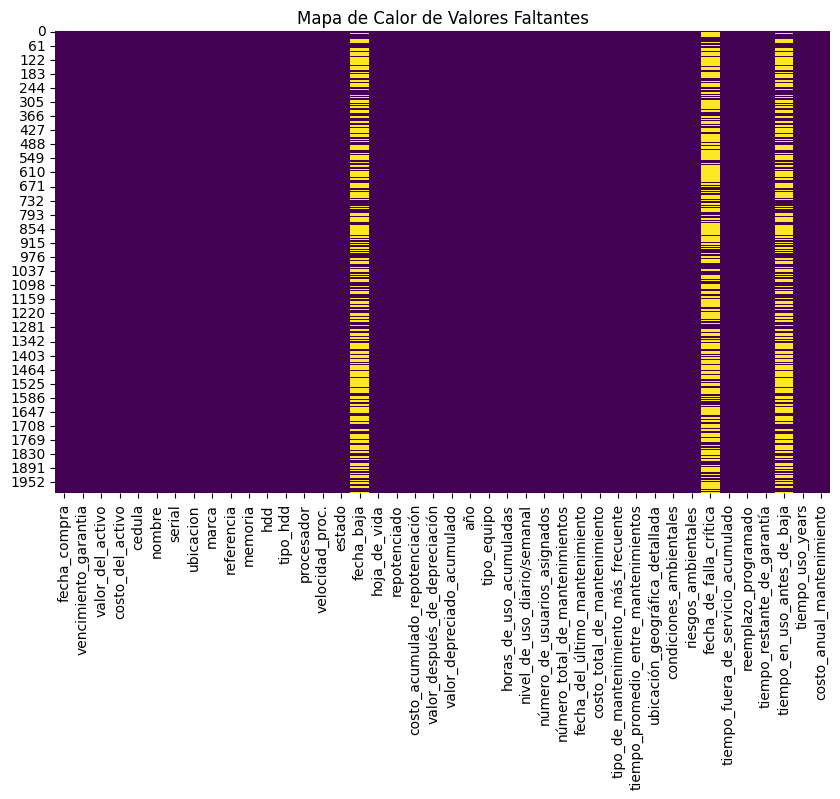


--- Distribución de la Variable de Costo Total de Mantenimiento Original: 'costo_total_de_mantenimiento' ---


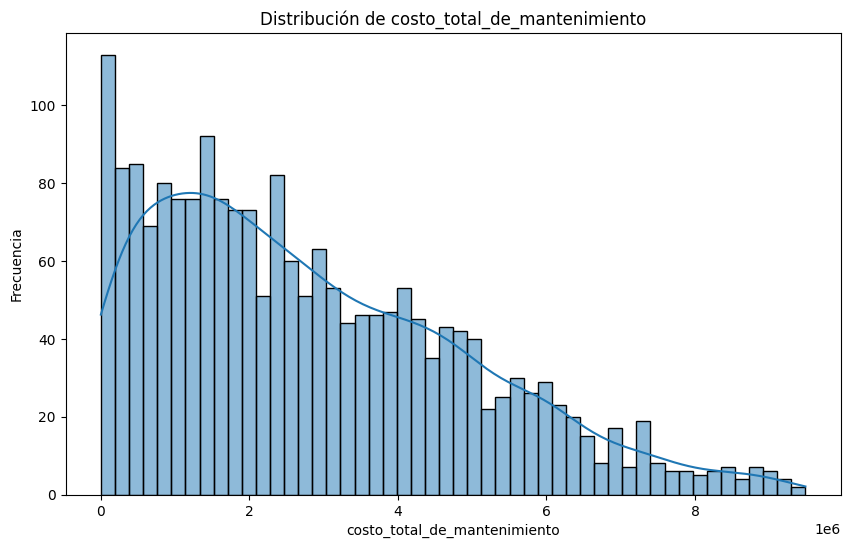


Estadísticas descriptivas para costo_total_de_mantenimiento:


,costo_total_de_mantenimiento
count,2.000000e+03
mean,2.820469e+06
std,2.107369e+06
min,0.000000e+00
25%,1.118873e+06
50%,2.418566e+06
75%,4.196794e+06
max,9.487536e+06


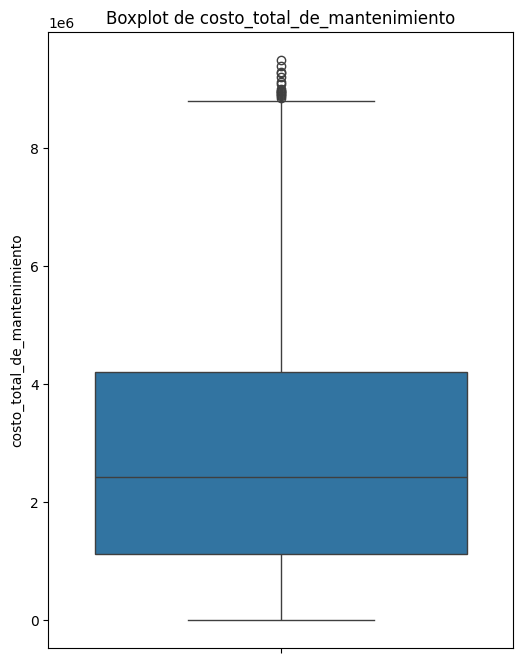


--- Distribución de la Variable Objetivo Calculada: 'costo_anual_mantenimiento' ---


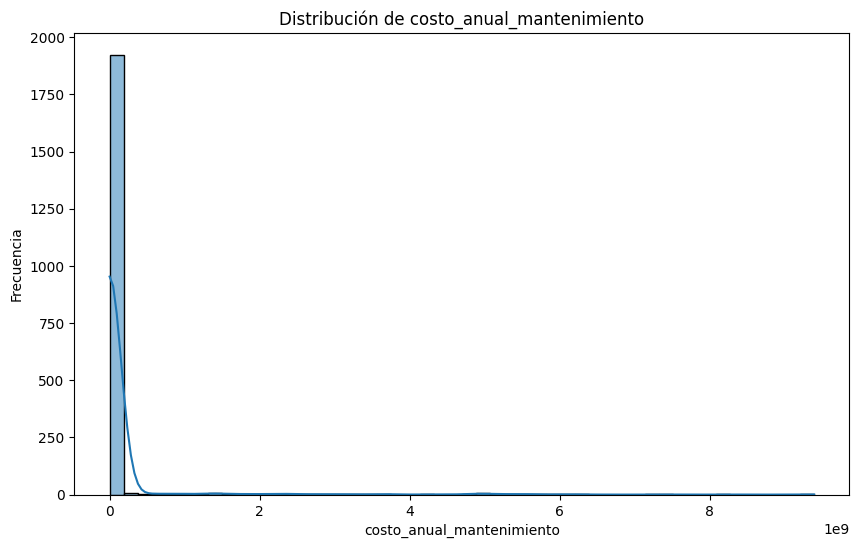


Estadísticas descriptivas para costo_anual_mantenimiento:


,costo_anual_mantenimiento
count,2.000000e+03
mean,1.108205e+08
std,6.920213e+08
min,0.000000e+00
25%,3.557097e+05
50%,8.424871e+05
75%,1.975131e+06
max,9.393163e+09


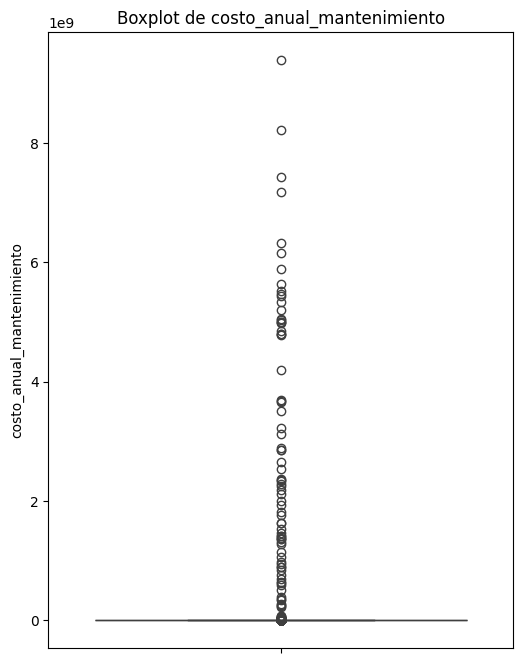


--- EDA para Características Numéricas ---
Distribución de características numéricas:

Análisis de la característica numérica: 'valor_del_activo'


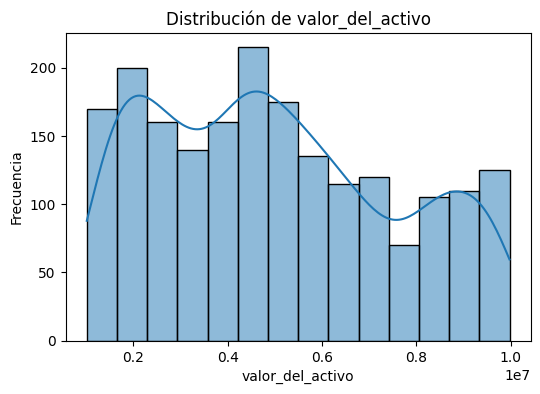

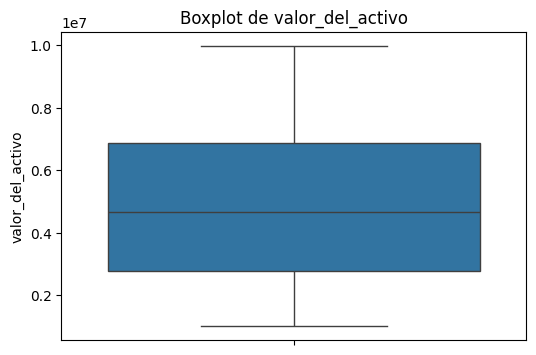


Análisis de la característica numérica: 'costo_del_activo'


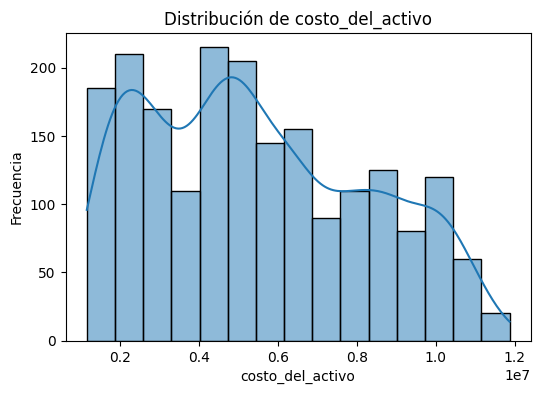

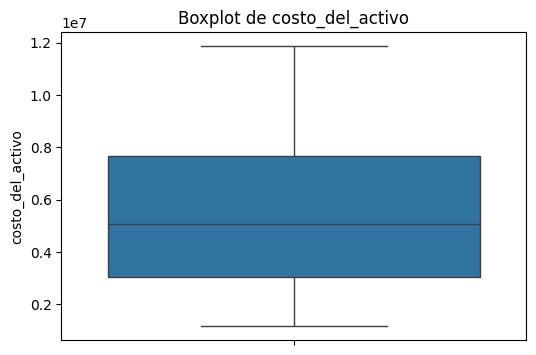


Análisis de la característica numérica: 'costo_acumulado_repotenciación'


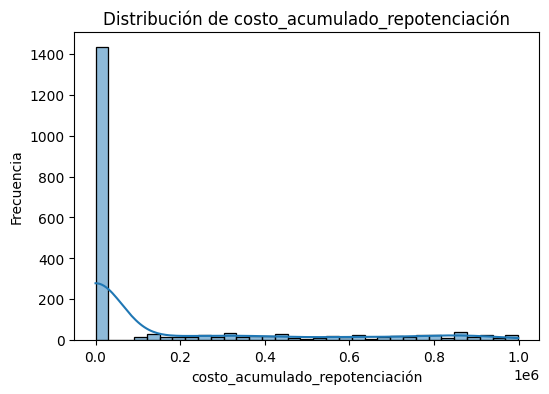

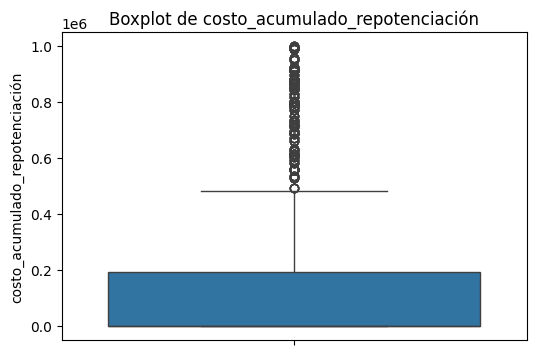


Análisis de la característica numérica: 'valor_después_de_depreciación'


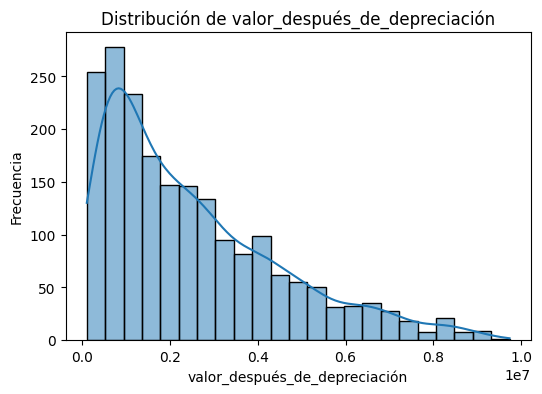

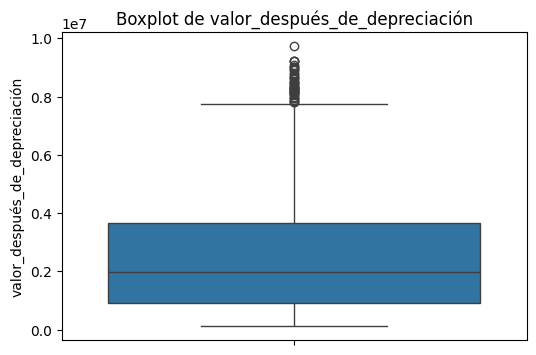


Análisis de la característica numérica: 'valor_depreciado_acumulado'


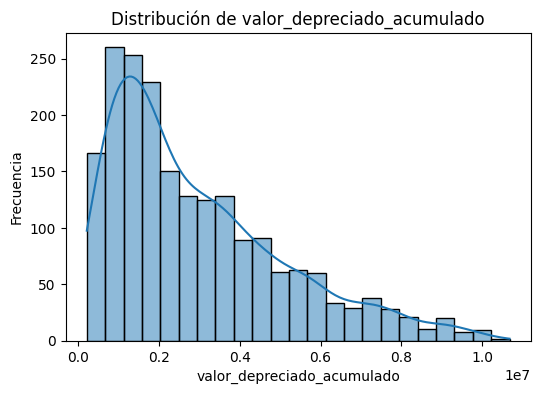

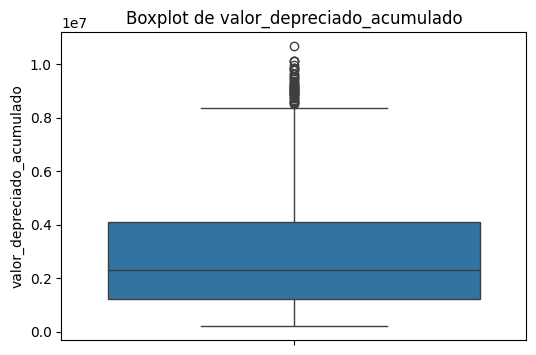


Análisis de la característica numérica: 'año'


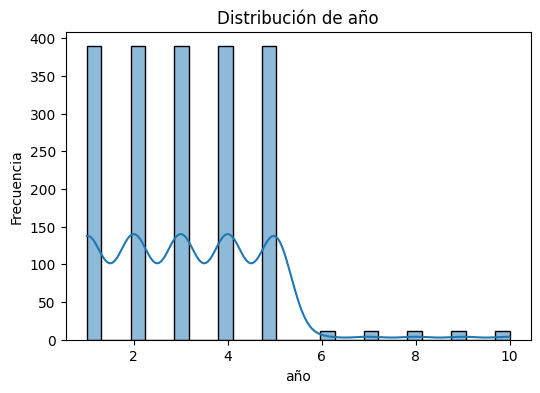

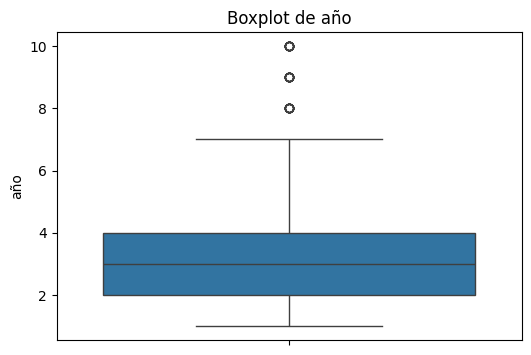


Análisis de la característica numérica: 'horas_de_uso_acumuladas'


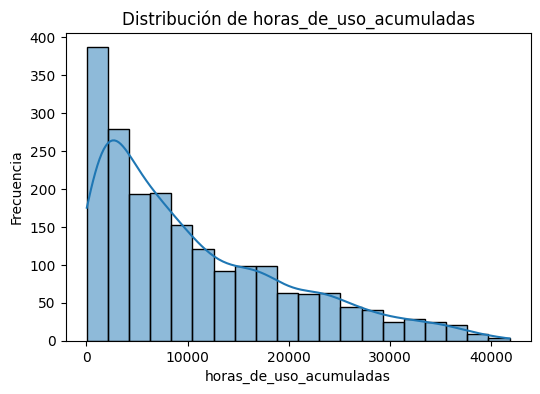

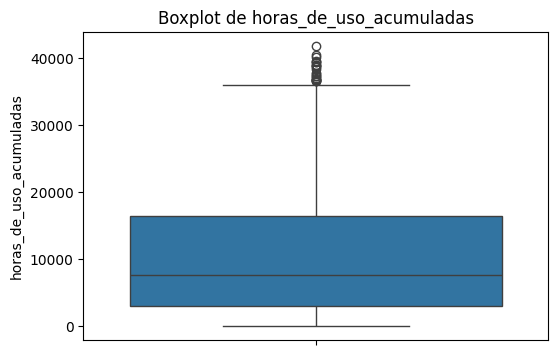


Análisis de la característica numérica: 'nivel_de_uso_diario/semanal'


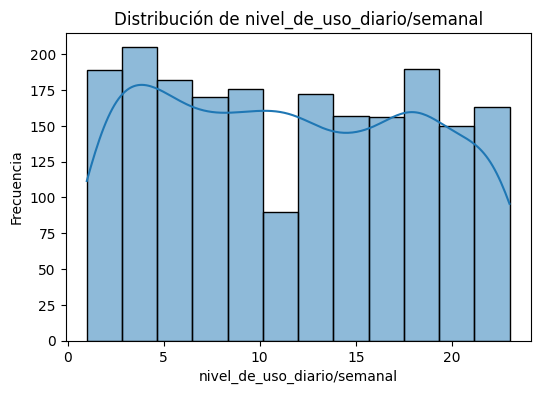

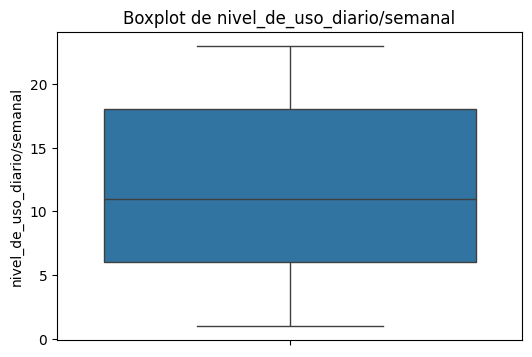


Análisis de la característica numérica: 'número_de_usuarios_asignados'


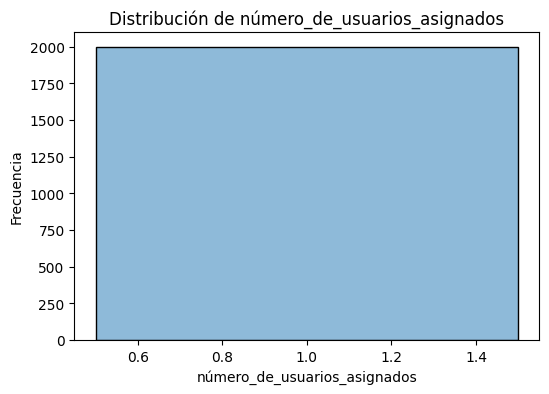

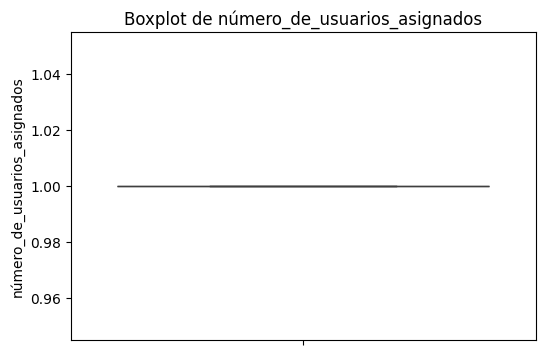


Análisis de la característica numérica: 'número_total_de_mantenimientos'


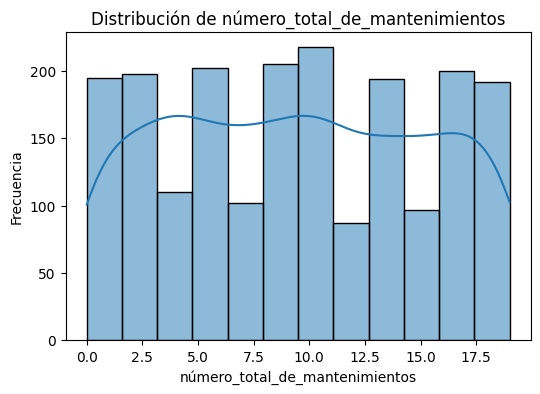

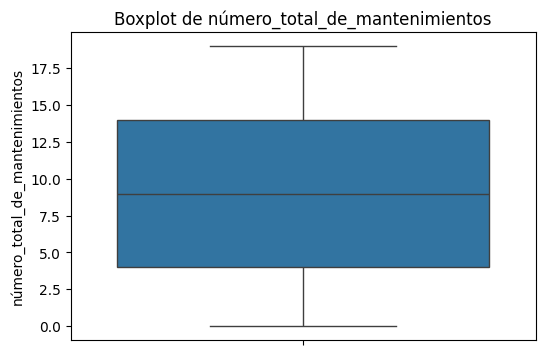


Análisis de la característica numérica: 'tiempo_promedio_entre_mantenimientos'


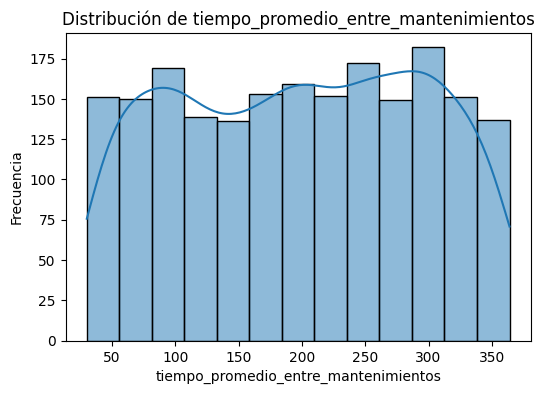

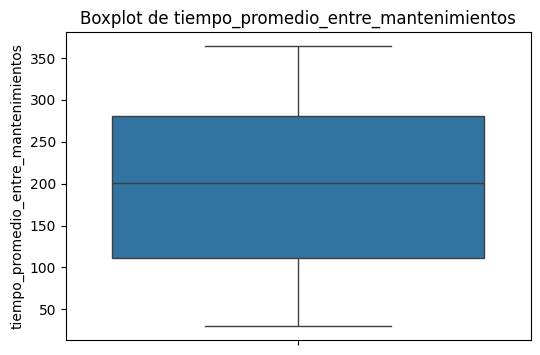


Análisis de la característica numérica: 'tiempo_fuera_de_servicio_acumulado'


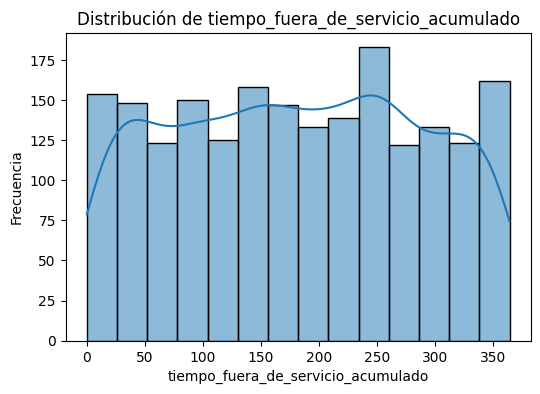

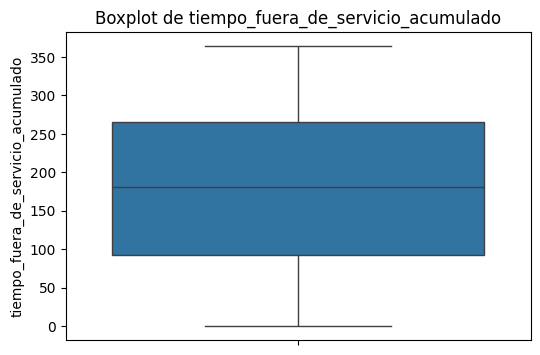


Análisis de la característica numérica: 'tiempo_restante_de_garantía'


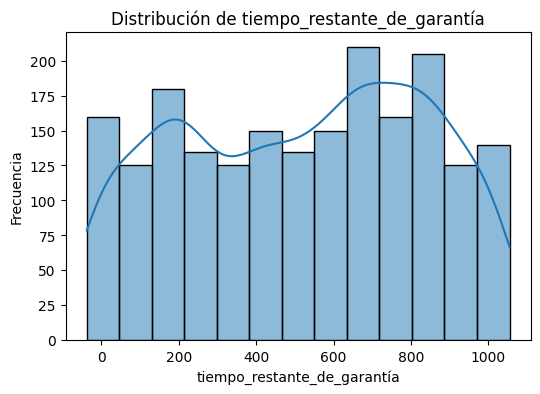

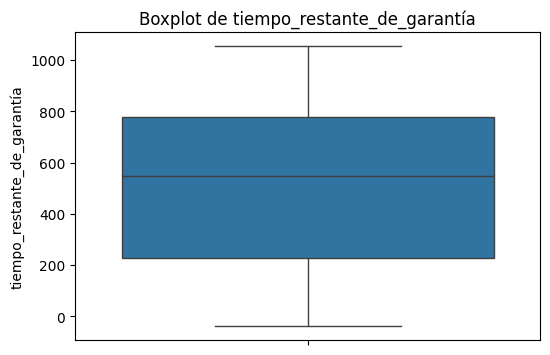


Análisis de la característica numérica: 'tiempo_en_uso_antes_de_baja'


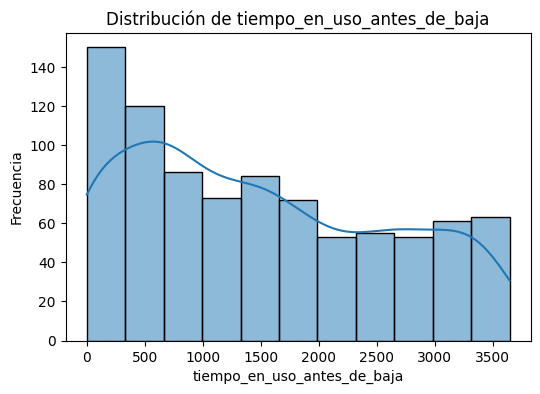

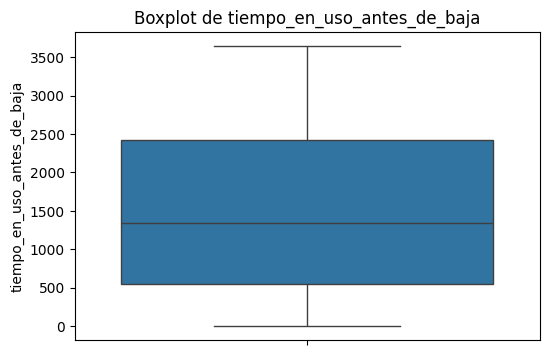


Análisis de la característica numérica: 'tiempo_uso_years'


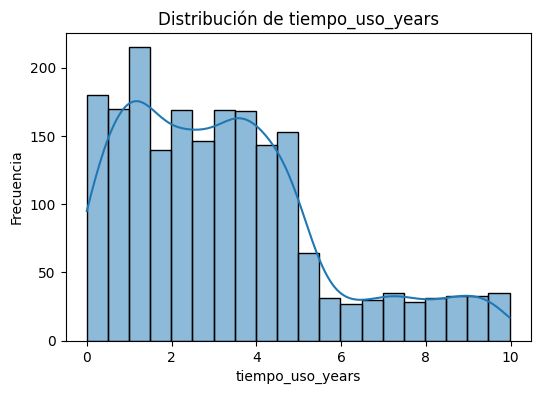

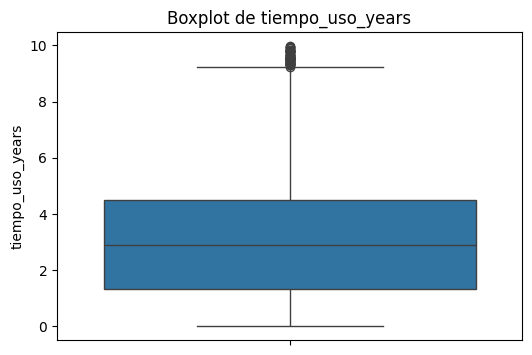


Relación de características numéricas con la variable objetivo 'costo_anual_mantenimiento':


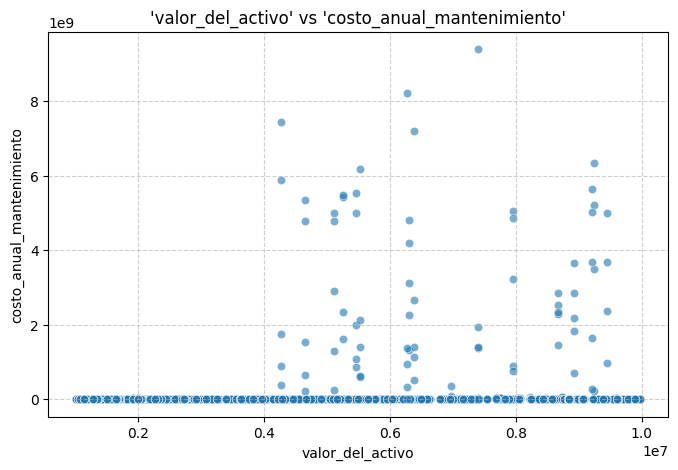

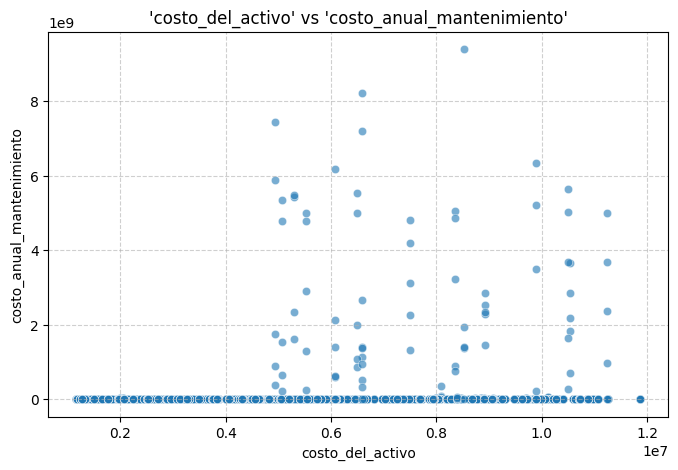

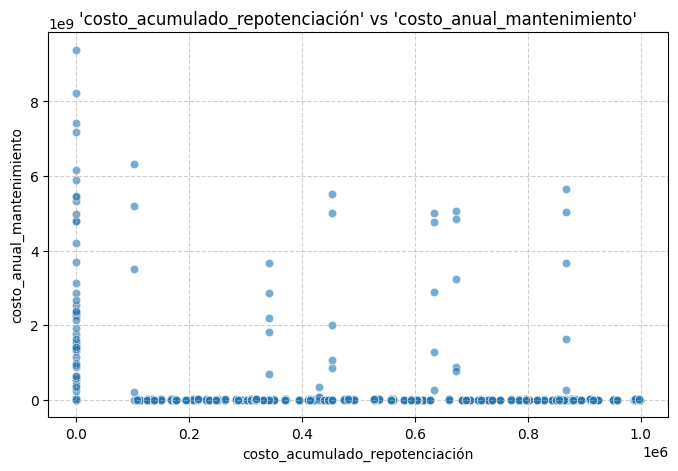

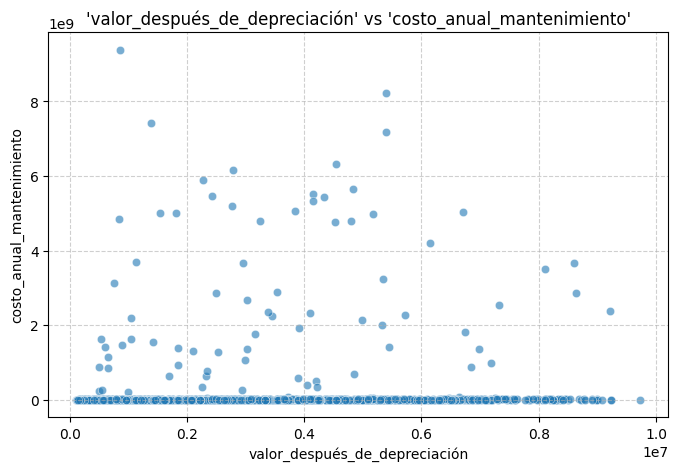

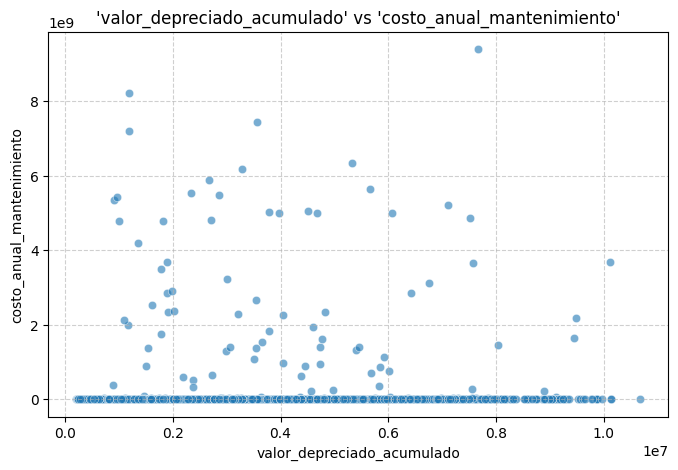

...

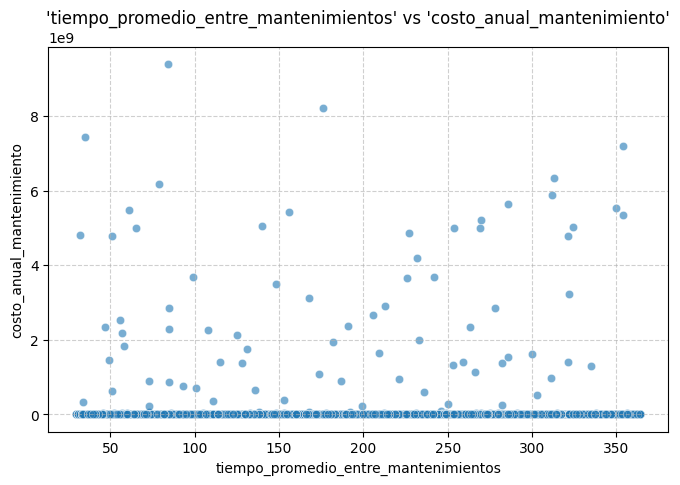

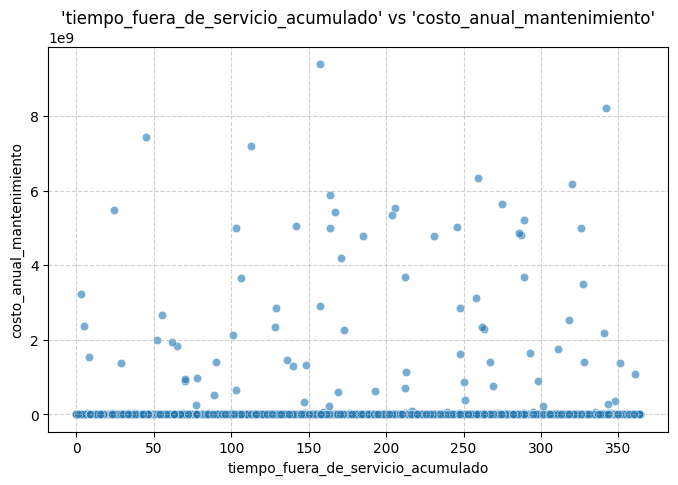

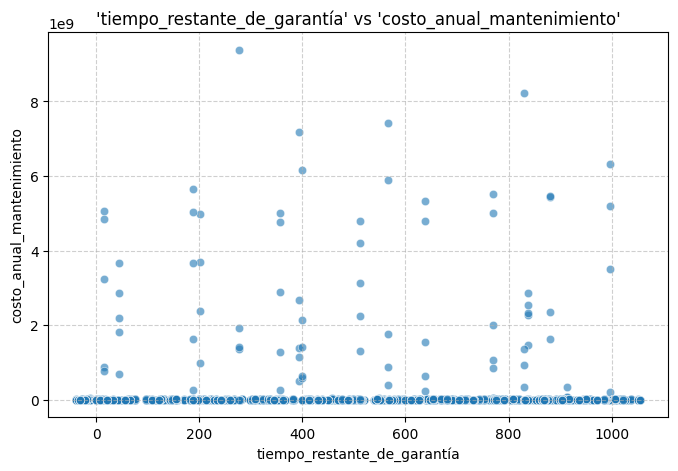

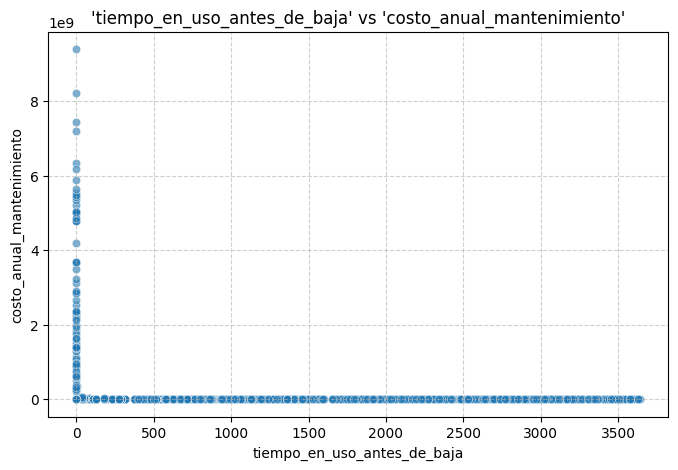

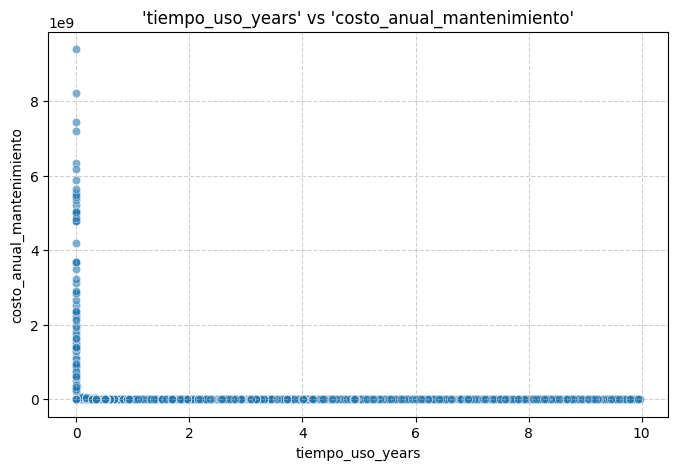


--- Matriz de Correlación de Características Numéricas (Relevantes) ---


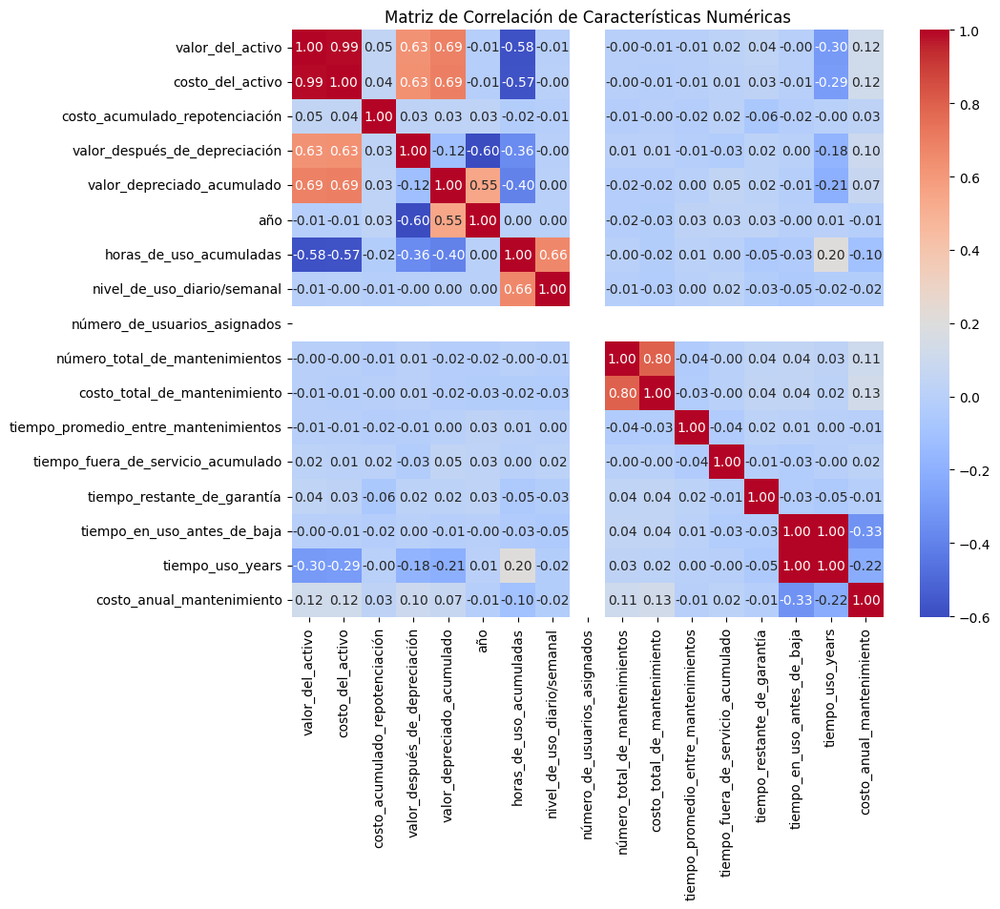


--- EDA para Características Categóricas ---
Distribución de categorías y relación con la variable objetivo (si existe) para características categóricas:

Análisis de la característica categórica: 'ubicacion'
Conteo de valores:


,count
ubicacion,
Medellín,990
Envigado,240
Bello,220
Itagüí,200
La Estrella,175
Sabaneta,175


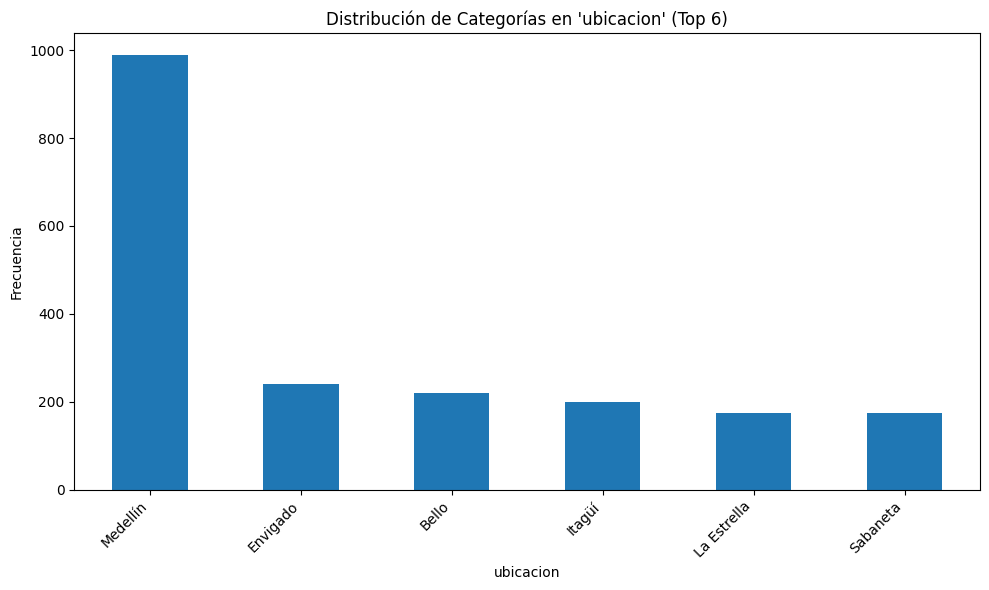

Relación de 'ubicacion' con 'costo_anual_mantenimiento' (Costo Anual de Mantenimiento):


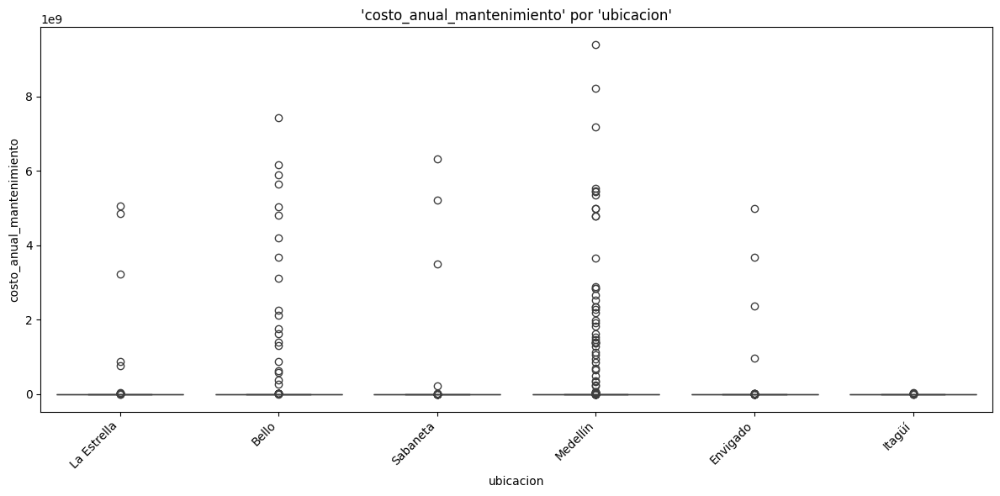


Análisis de la característica categórica: 'marca'
Conteo de valores:


,count
marca,
Acer,455
Lenovo,410
Dell,395
Asus,385
HP,355


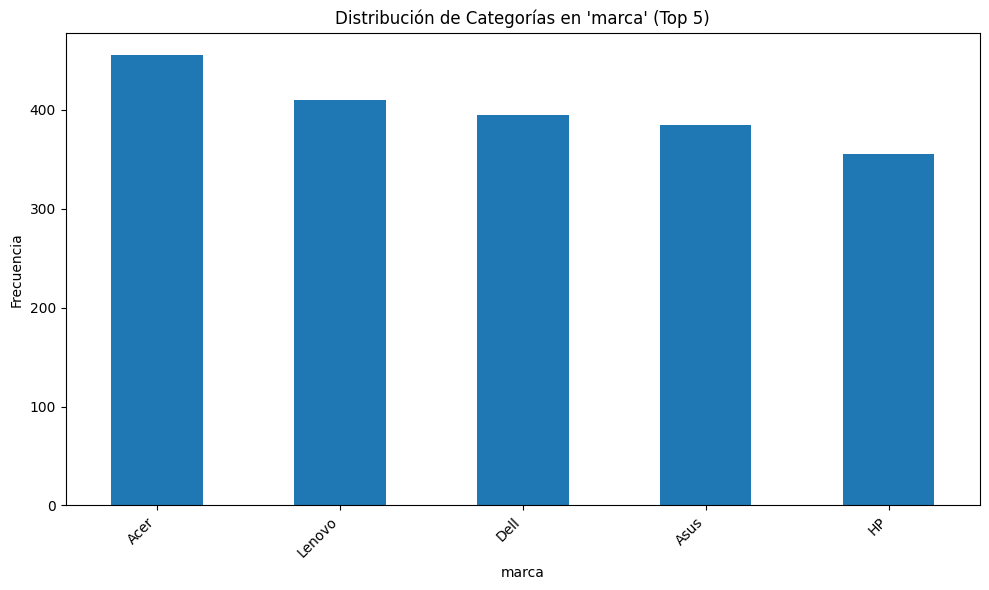

Relación de 'marca' con 'costo_anual_mantenimiento' (Costo Anual de Mantenimiento):


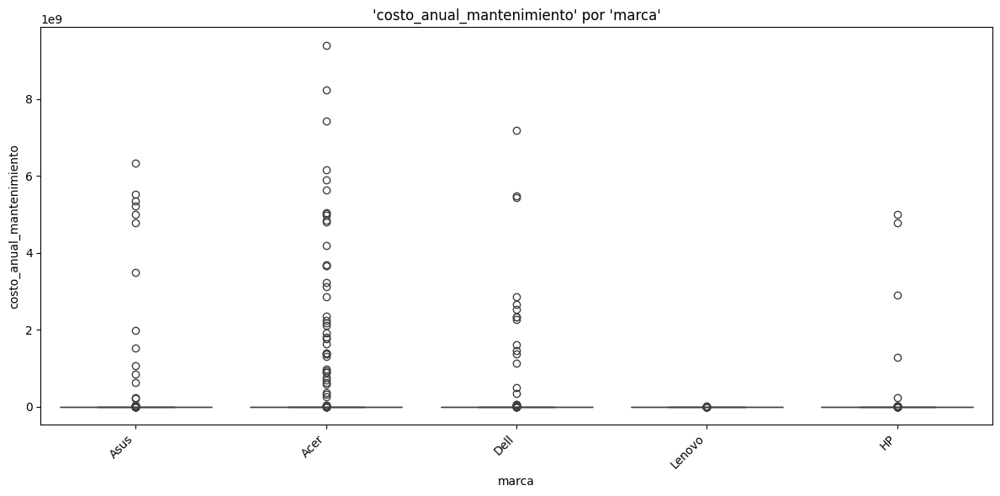


Análisis de la característica categórica: 'referencia'
Conteo de valores:


,count
referencia,
Inspiron,460
Aspire,405
ThinkPad,380
VivoBook,380
ProBook,375


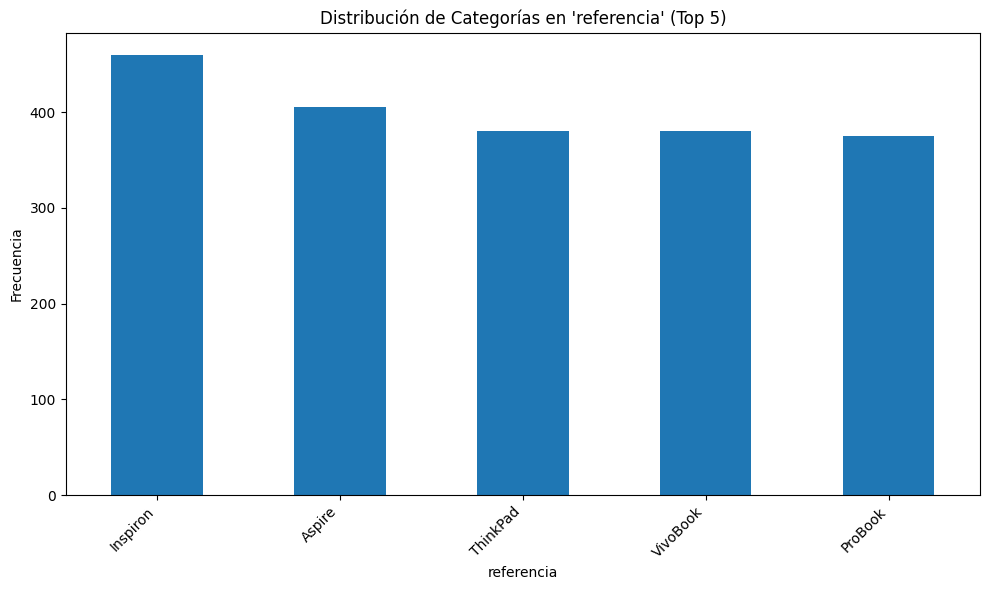

Relación de 'referencia' con 'costo_anual_mantenimiento' (Costo Anual de Mantenimiento):


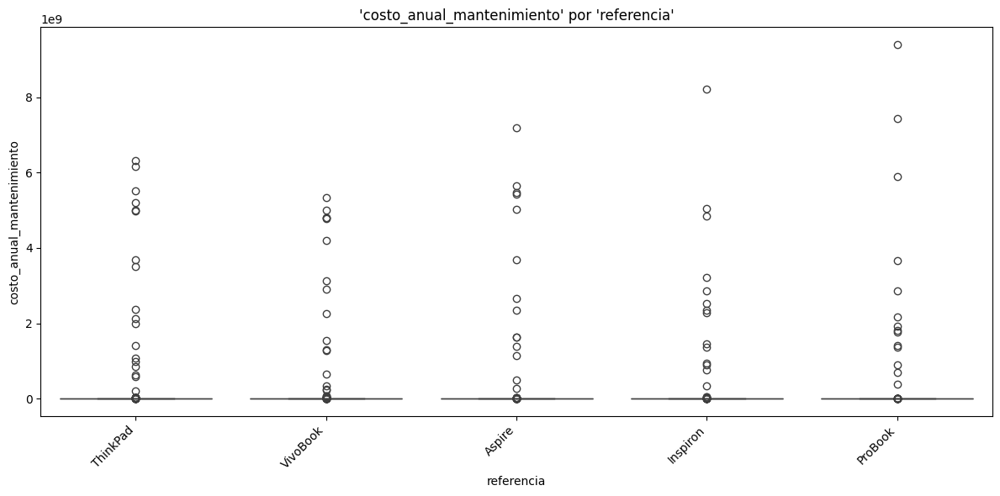


Análisis de la característica categórica: 'memoria'
Conteo de valores:


,count
memoria,
4 GB,720
8 GB,715
16 GB,195
64 GB,195
32 GB,175


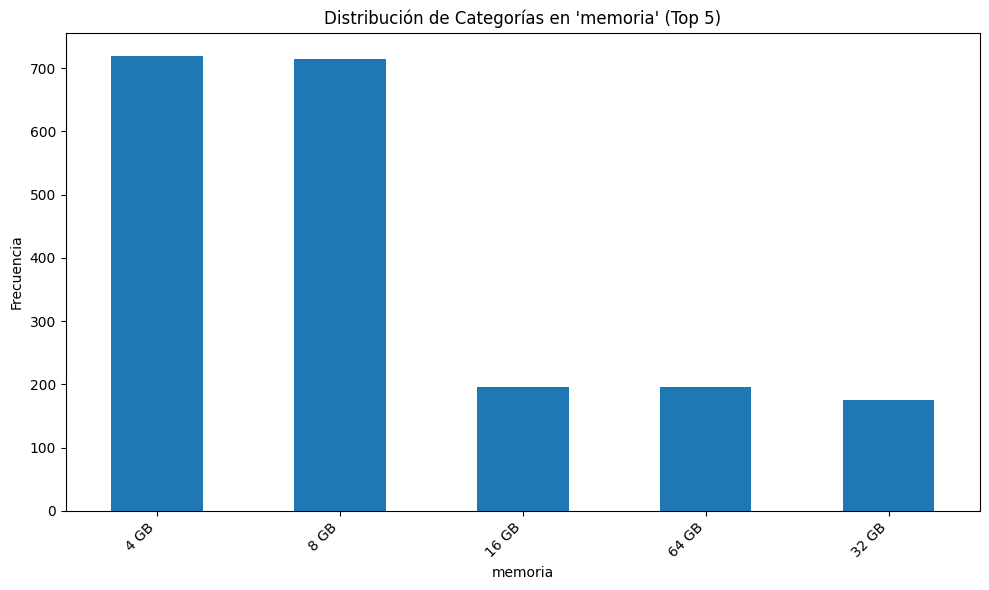

Relación de 'memoria' con 'costo_anual_mantenimiento' (Costo Anual de Mantenimiento):


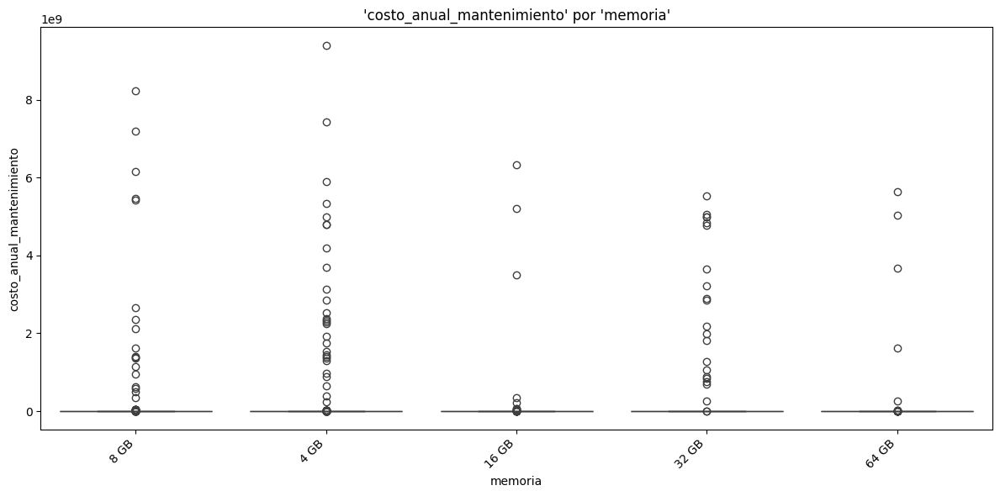


Análisis de la característica categórica: 'hdd'
Conteo de valores:


,count
hdd,
512 GB,425
1.5 TB,400
2 TB,390
1 TB,305
256 GB,250
128 GB,230


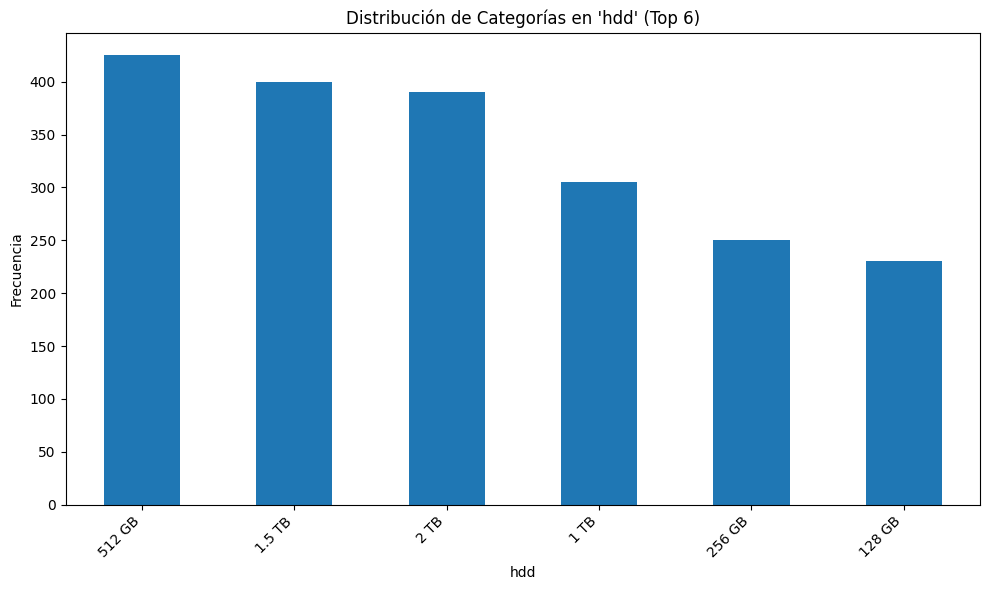

Relación de 'hdd' con 'costo_anual_mantenimiento' (Costo Anual de Mantenimiento):


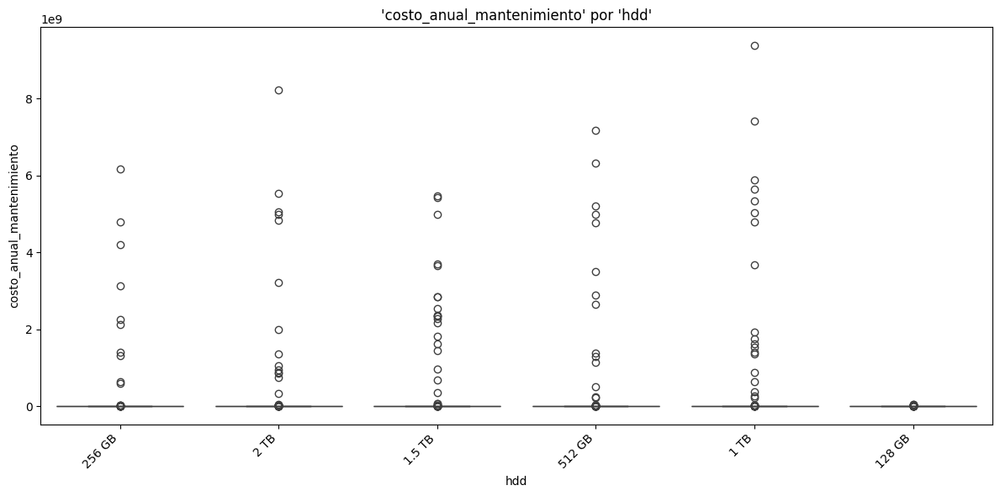


Análisis de la característica categórica: 'tipo_hdd'
Conteo de valores:


,count
tipo_hdd,
HDD,1010
SSD,990


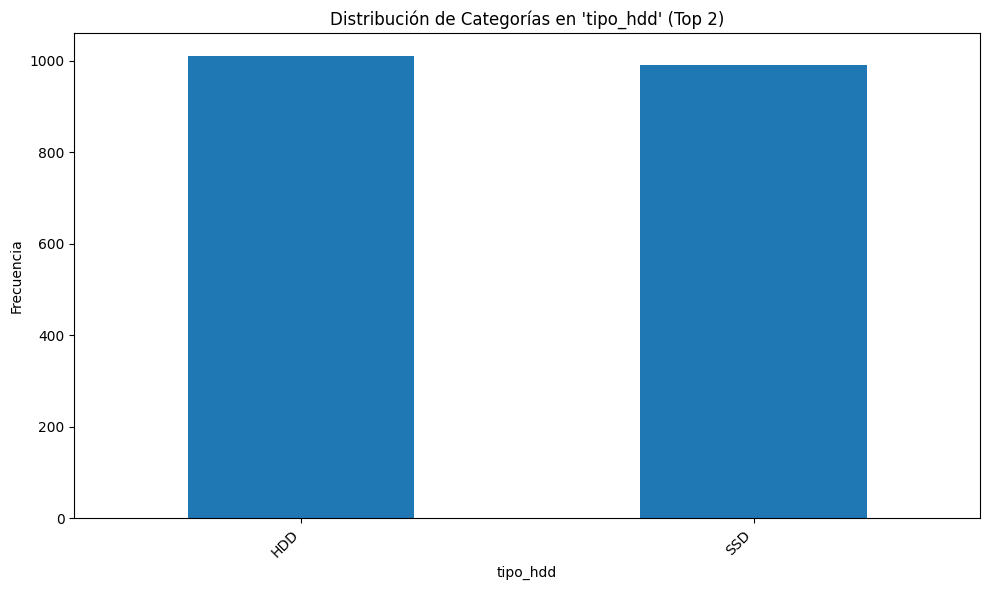

Relación de 'tipo_hdd' con 'costo_anual_mantenimiento' (Costo Anual de Mantenimiento):


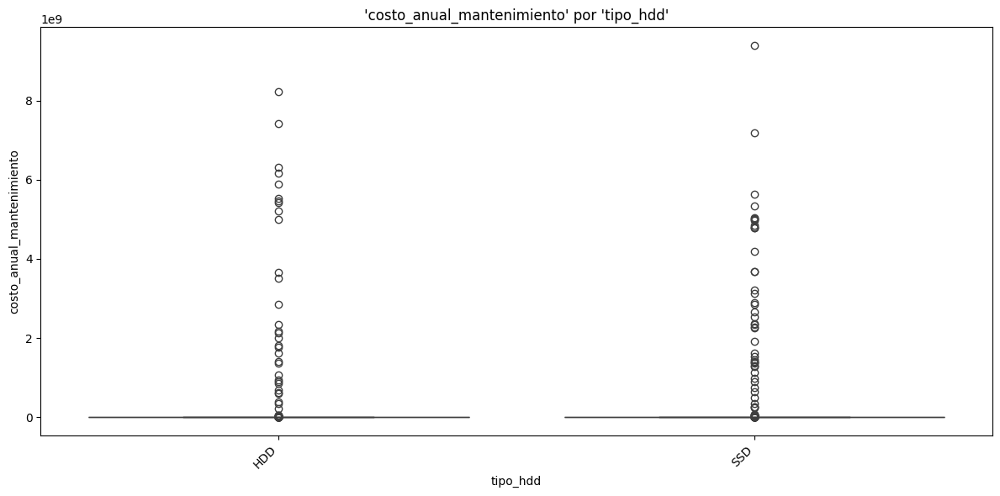


Análisis de la característica categórica: 'procesador'
Conteo de valores:


,count
procesador,
Intel Core i5,745
Intel Core i3,690
Intel Core i7,205
AMD Ryzen 5,185
AMD Ryzen 7,175


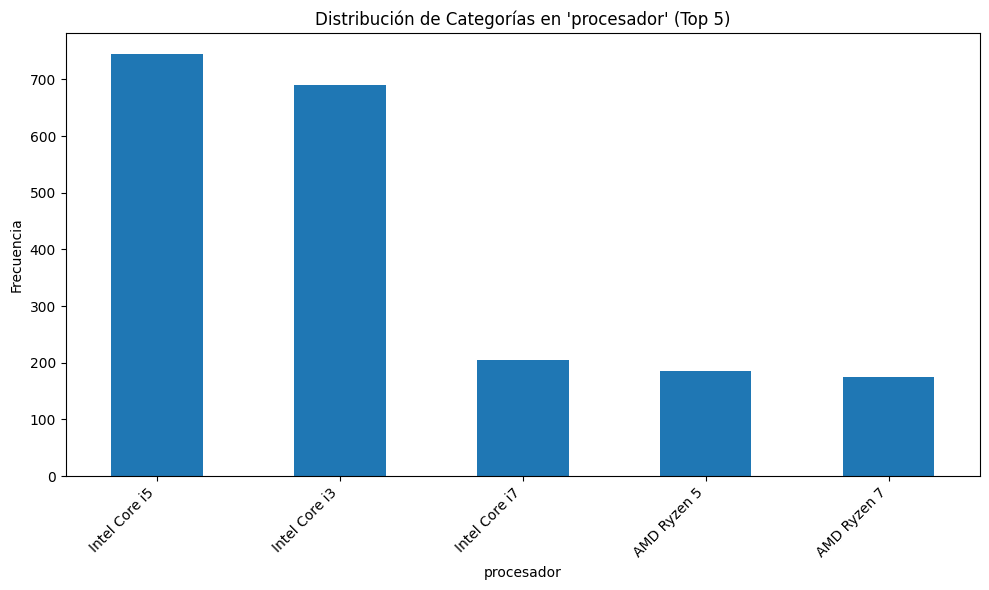

Relación de 'procesador' con 'costo_anual_mantenimiento' (Costo Anual de Mantenimiento):


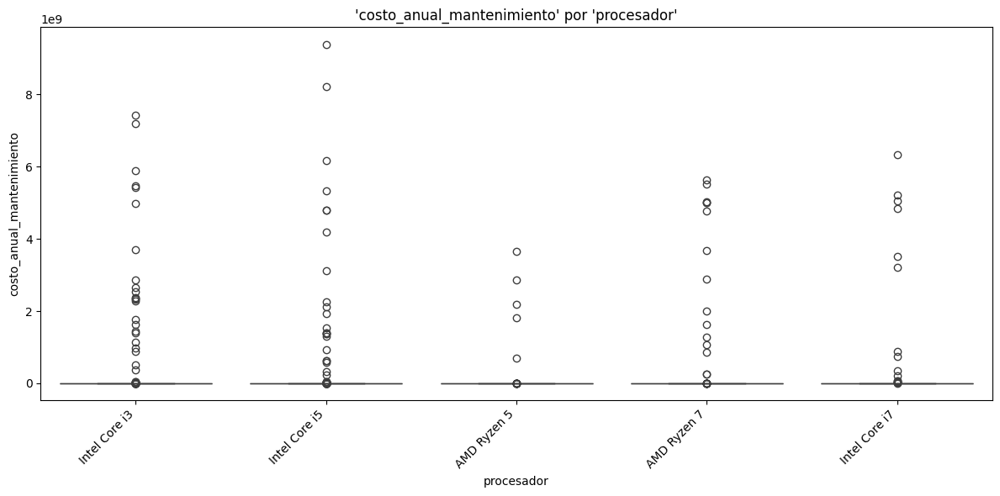


Análisis de la característica categórica: 'velocidad_proc.'
Conteo de valores:


,count
velocidad_proc.,
3.0 GHz,165
2.3 GHz,135
3.2 GHz,130
3.1 GHz,125
3.3 GHz,125
3.4 GHz,120
3.5 GHz,115
2.4 GHz,110
2.5 GHz,110


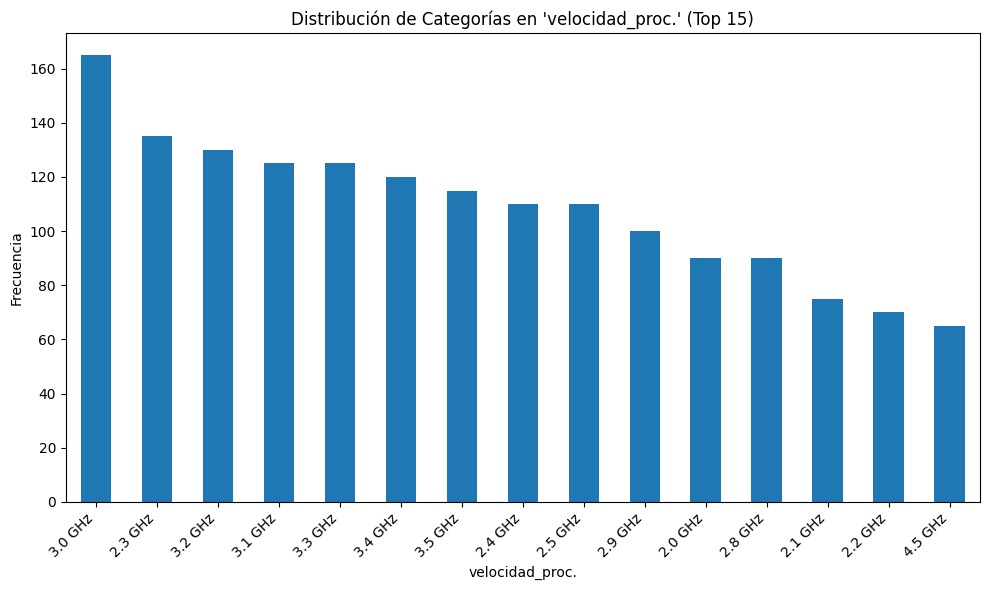

Relación de 'velocidad_proc.' con 'costo_anual_mantenimiento' (Costo Anual de Mantenimiento):


<Figure size 1200x600 with 0 Axes>

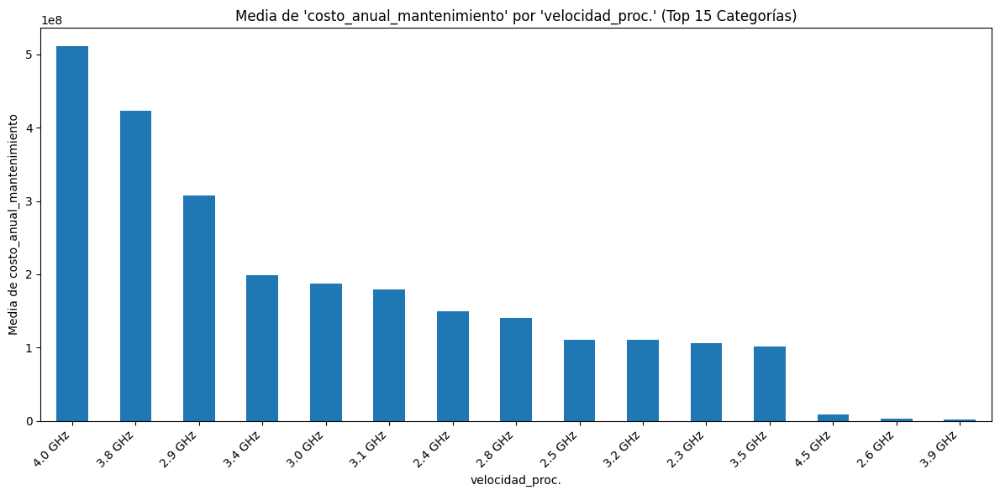


Análisis de la característica categórica: 'estado'
Conteo de valores:


,count
estado,
Operativo,760
En reparación,625
Fuera de servicio,615


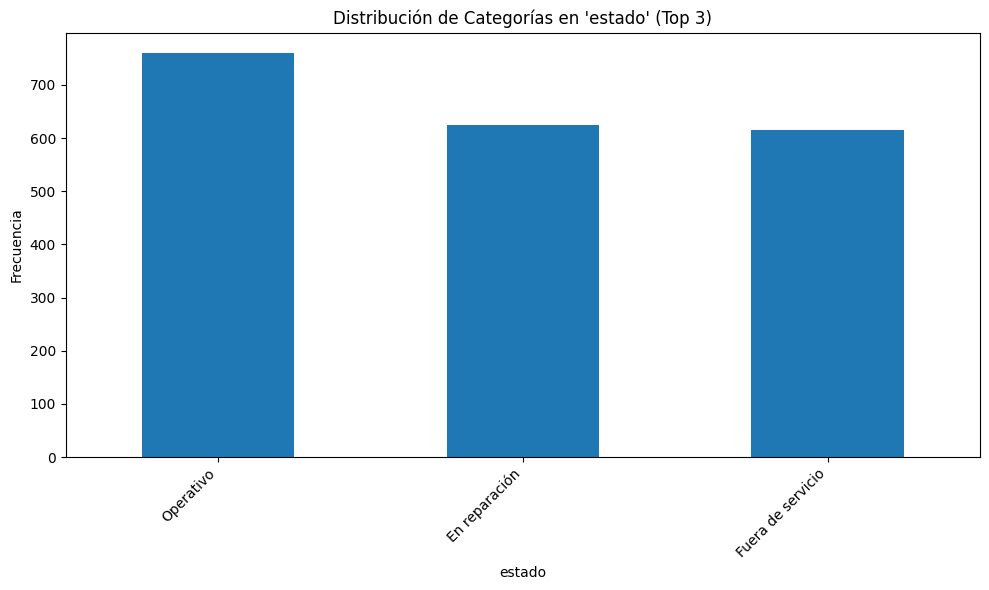

Relación de 'estado' con 'costo_anual_mantenimiento' (Costo Anual de Mantenimiento):


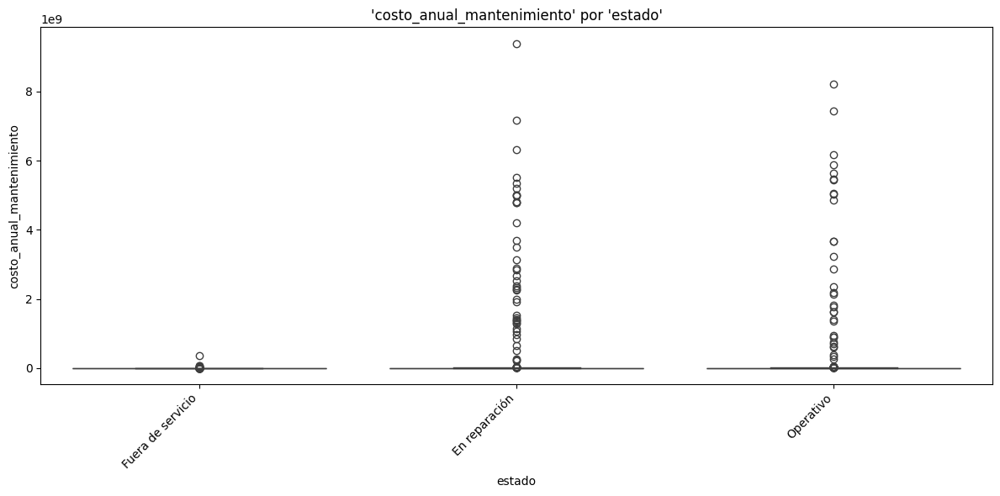


Análisis de la característica categórica: 'hoja_de_vida'
Conteo de valores:


,count
hoja_de_vida,
En proceso de reparación,1360
Operativo,640


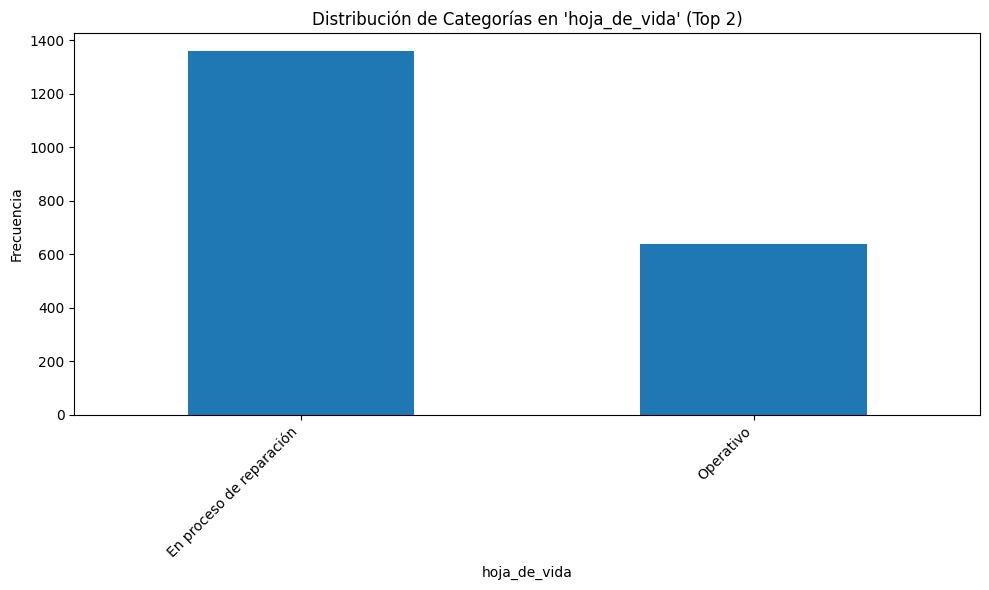

Relación de 'hoja_de_vida' con 'costo_anual_mantenimiento' (Costo Anual de Mantenimiento):


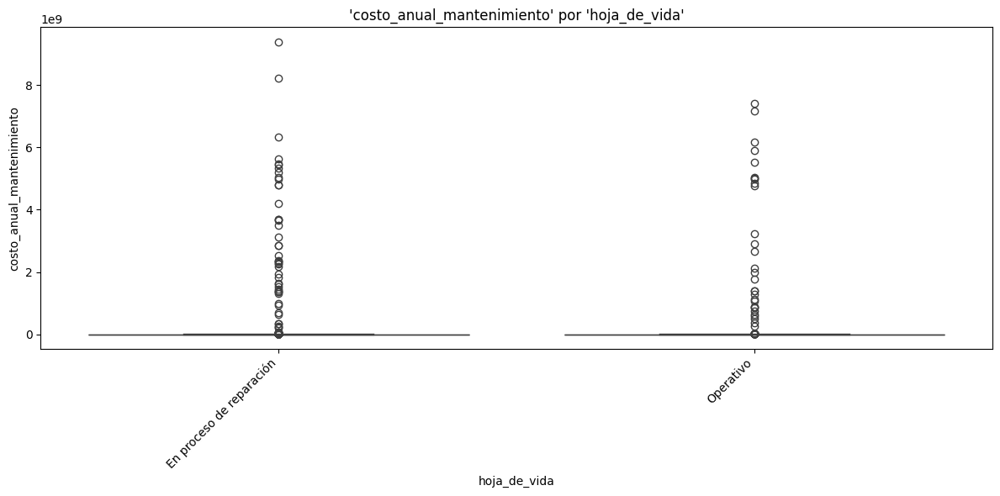


Análisis de la característica categórica: 'tipo_equipo'
Conteo de valores:


,count
tipo_equipo,
Computodef,2000


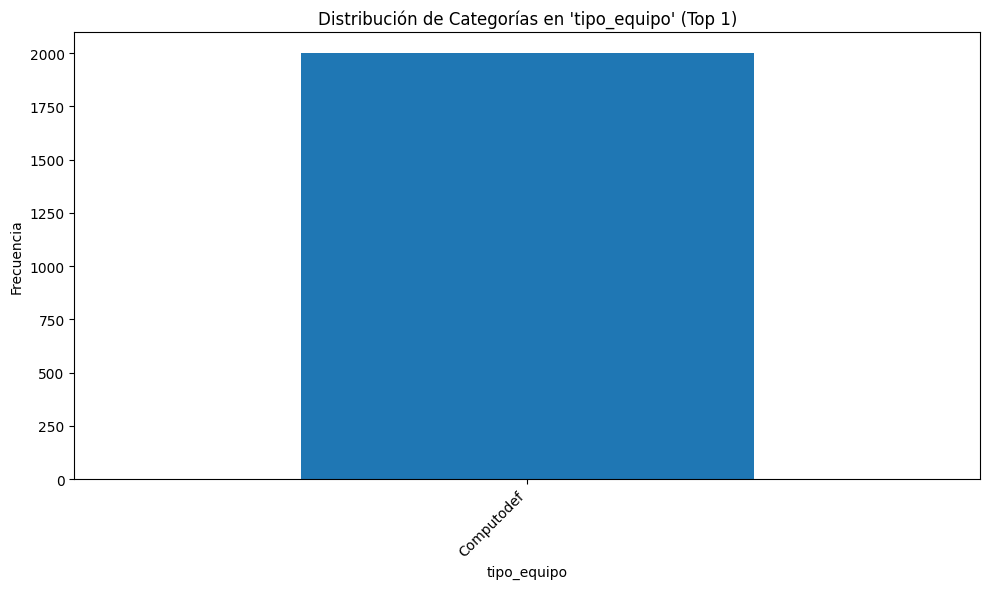

Relación de 'tipo_equipo' con 'costo_anual_mantenimiento' (Costo Anual de Mantenimiento):
La característica categórica 'tipo_equipo' tiene solo un valor único. No se puede mostrar la relación con 'costo_anual_mantenimiento' mediante boxplot/barplot por categoría.

Análisis de la característica categórica: 'tipo_de_mantenimiento_más_frecuente'
Conteo de valores:


,count
tipo_de_mantenimiento_más_frecuente,
Preventivo,1008
Correctivo,503
Predictivo,489


<Figure size 1200x600 with 0 Axes>

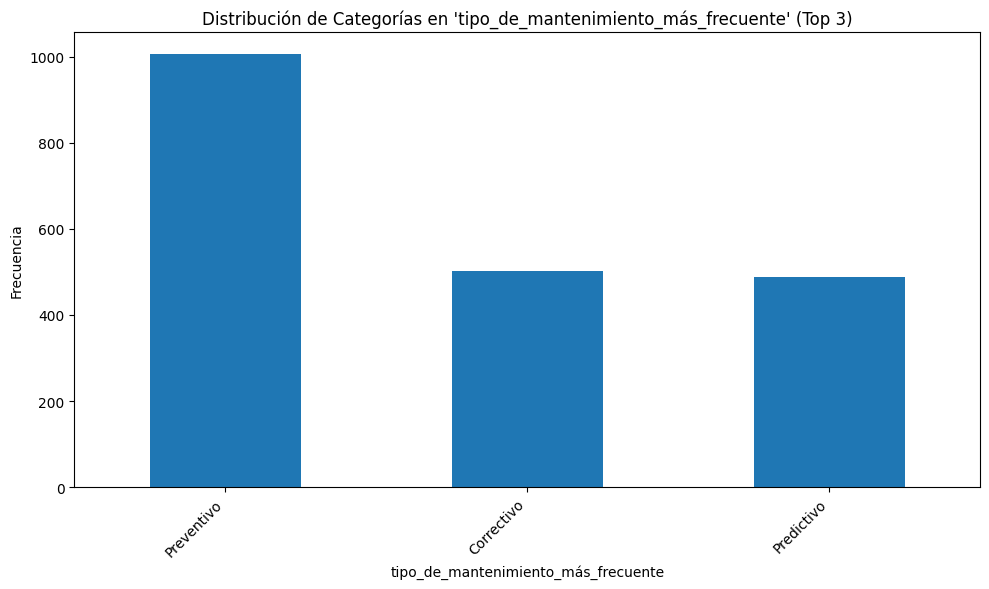

Relación de 'tipo_de_mantenimiento_más_frecuente' con 'costo_anual_mantenimiento' (Costo Anual de Mantenimiento):


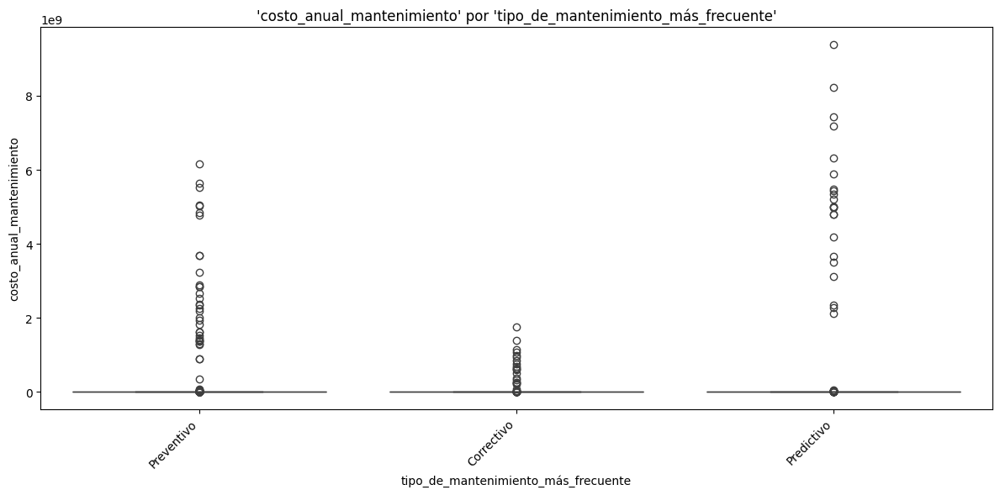


Análisis de la característica categórica: 'ubicación_geográfica_detallada'
Conteo de valores:


,count
ubicación_geográfica_detallada,
Ciudad_1983,1
Ciudad_1982,1
Ciudad_1981,1
Ciudad_1980,1
Ciudad_1979,1
Ciudad_1978,1
Ciudad_1977,1
Ciudad_1976,1
Ciudad_1975,1


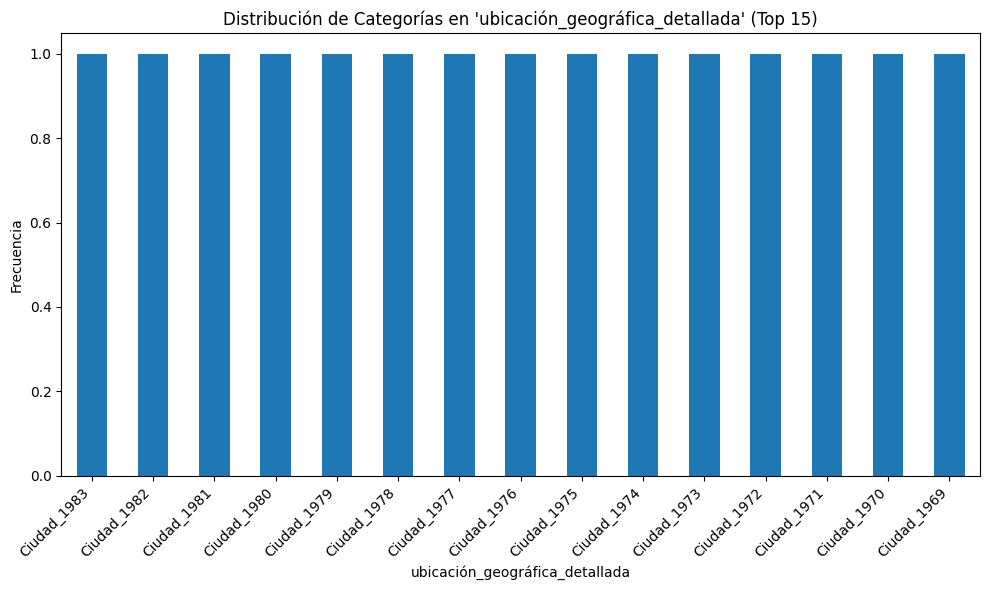

Relación de 'ubicación_geográfica_detallada' con 'costo_anual_mantenimiento' (Costo Anual de Mantenimiento):


<Figure size 1200x600 with 0 Axes>

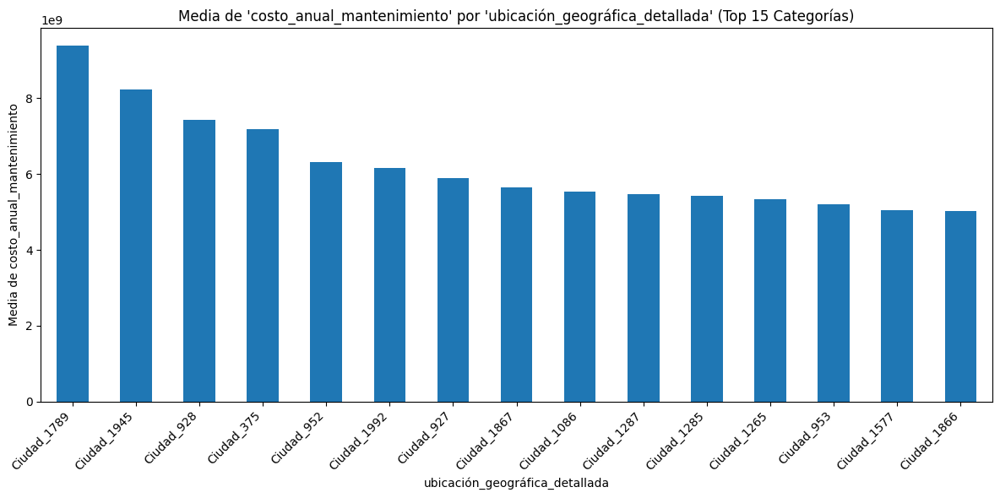


Análisis de la característica categórica: 'condiciones_ambientales'
Conteo de valores:


,count
condiciones_ambientales,
Polvo,554
Vibración,507
Humedad alta,473
Temperatura alta,466


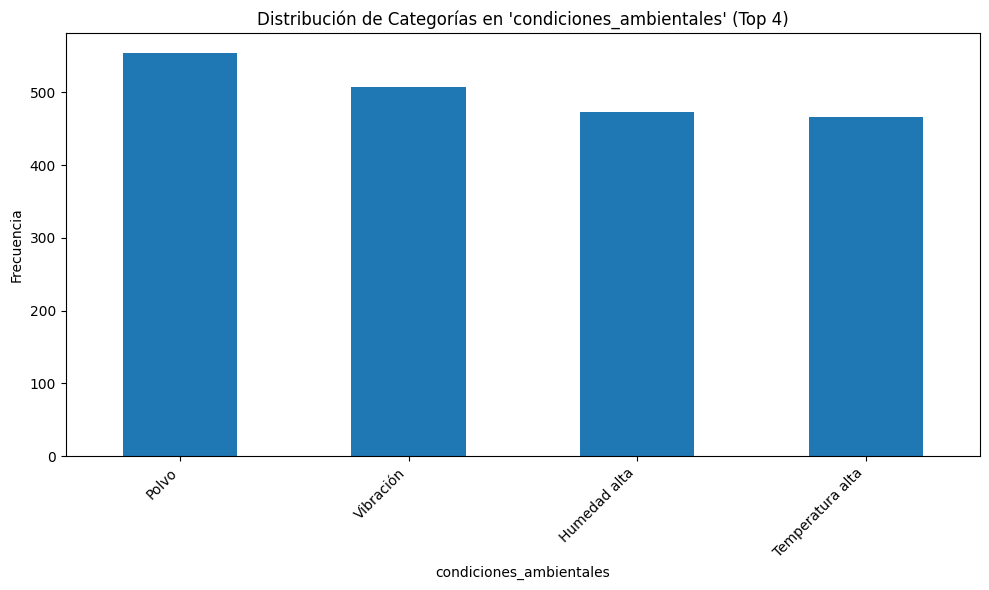

Relación de 'condiciones_ambientales' con 'costo_anual_mantenimiento' (Costo Anual de Mantenimiento):


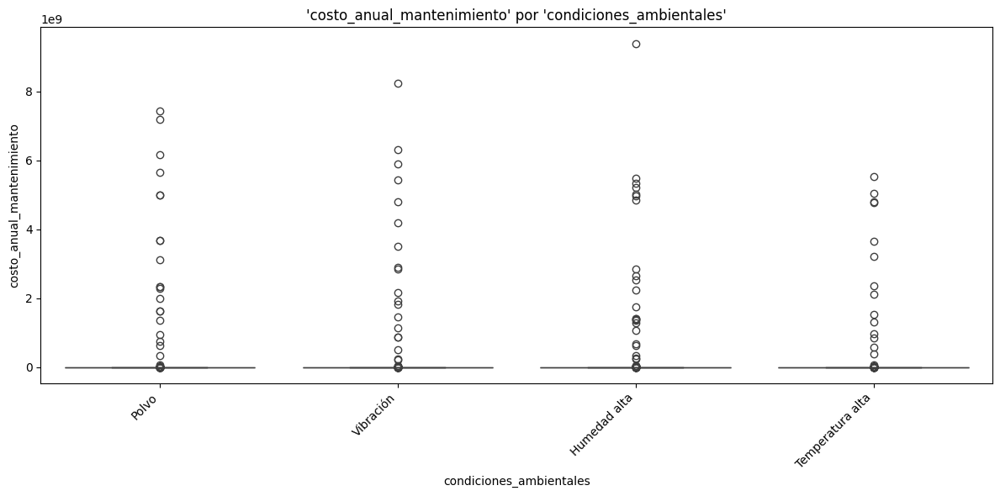


Análisis de la característica categórica: 'riesgos_ambientales'
Conteo de valores:


,count
riesgos_ambientales,
Agua,522
Corrosión,519
Vandalismo,487
Fuego,472


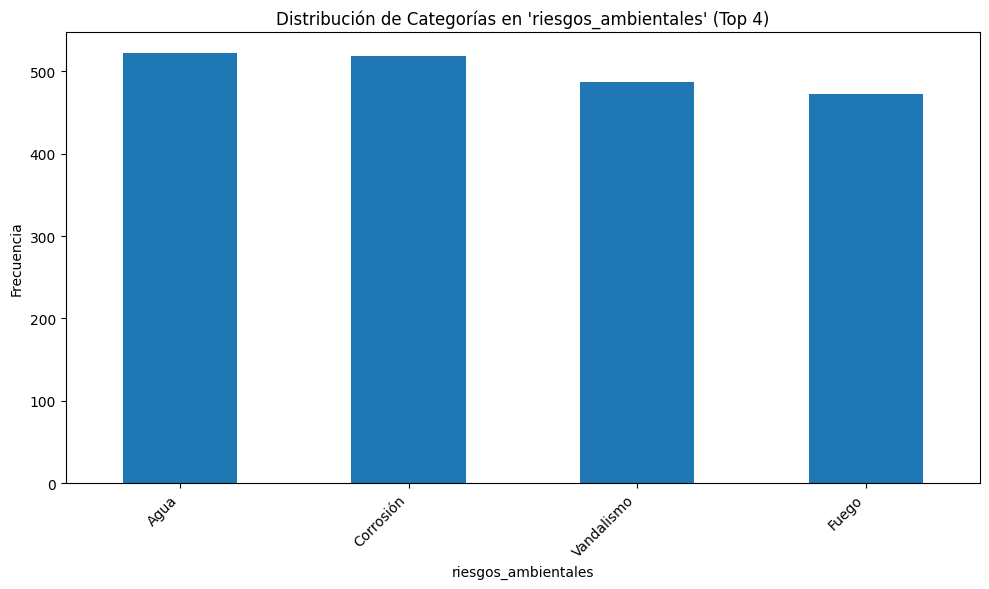

Relación de 'riesgos_ambientales' con 'costo_anual_mantenimiento' (Costo Anual de Mantenimiento):


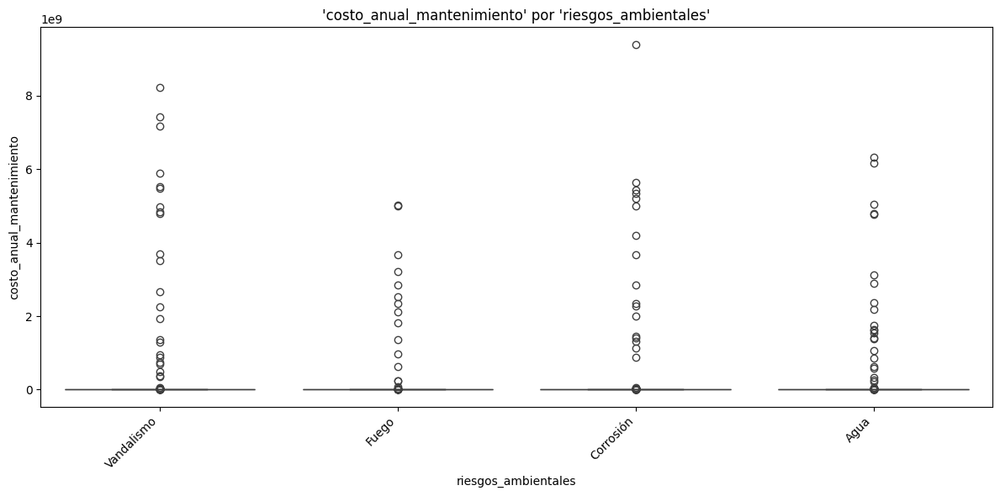

In [ ]:
from IPython import get_ipython
from IPython.display import display
# %%
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os # Importar el módulo os para crear directorios
import re # Importar el módulo re para expresiones regulares


# Nombre del archivo Excel
excel_file_name = 'Computodef_Propuesta.xlsx'

# Define la variable objetivo original para referencia en EDA
target_raw_col = "Costo total de mantenimiento"
# Define el nombre de la variable objetivo calculada (para contexto, pero el focus es el raw cost)
target_col = "costo_anual_mantenimiento"

# Define el directorio para guardar las imágenes
output_dir = 'eda_plots'
os.makedirs(output_dir, exist_ok=True) # Crea el directorio si no existe

print(f"Los gráficos del EDA se guardarán en el directorio: '{output_dir}'")

# Función para crear un nombre de archivo seguro a partir de un nombre de columna
def clean_col_name_for_filename(col_name):
    """Limpia el nombre de una columna para usarlo como nombre de archivo."""
    # Reemplazar caracteres que no son letras, números o guiones bajos con guiones bajos
    cleaned_name = re.sub(r'[^a-zA-Z0-9_]', '_', col_name)
    # Reemplazar múltiples guiones bajos consecutivos con uno solo
    cleaned_name = re.sub(r'_+', '_', cleaned_name)
    # Eliminar guiones bajos al principio o al final si los hay
    cleaned_name = cleaned_name.strip('_')
    # Si el nombre queda vacío después de la limpieza, usar un nombre genérico
    if not cleaned_name:
        return 'cleaned_feature'
    return cleaned_name

# 1. Cargar los datos
df = None
try:
    df = pd.read_excel(excel_file_name, engine='openpyxl')
    print(f"Archivo '{excel_file_name}' cargado exitosamente.")
except FileNotFoundError:
    print(f"Error: Archivo '{excel_file_name}' no encontrado. Asegúrate de que el archivo esté en el directorio correcto de Colab.")
except Exception as e:
    print(f"Error al cargar o leer el archivo '{excel_file_name}': {e}")

# Proceder con EDA solo si el DataFrame se cargó exitosamente
if df is not None:
    print(f"\nFilas y columnas cargadas: {df.shape}")
    print("\nPrimeras 5 filas del DataFrame original:")
    display(df.head())

    # 2. Limpiar nombres de columnas para consistencia
    df.columns = df.columns.str.strip().str.replace(' ', '_').str.lower()
    print("\nColumnas del DataFrame limpias:")
    print(df.columns.tolist(), "\n")

    # 3. Cálculo de variables derivadas importantes para el contexto (si existen las columnas necesarias)
    cleaned_target_raw_col = target_raw_col.lower().replace(' ', '_')
    date_purchase_col = "fecha_compra"
    date_disposal_col = "fecha_baja"

    # Intentar convertir costo total de mantenimiento a numérico (ESTA ES LA COLUMNA QUE QUEREMOS ANALIZAR)
    if cleaned_target_raw_col in df.columns:
        df[cleaned_target_raw_col] = pd.to_numeric(df[cleaned_target_raw_col], errors="coerce")
        print(f"\nColumna de costo total de mantenimiento original '{cleaned_target_raw_col}' procesada.")
    else:
        print(f"Advertencia: Columna de costo total de mantenimiento original '{cleaned_target_raw_col}' no encontrada.")


    # Intentar calcular tiempo_uso_years (necesario para el cálculo del costo anual, aunque no el foco principal del EDA ahora)
    if date_purchase_col in df.columns and date_disposal_col in df.columns:
        try:
            df[date_purchase_col] = pd.to_datetime(df[date_purchase_col], errors="coerce")
            df[date_disposal_col] = pd.to_datetime(df[date_disposal_col], errors="coerce")

            today = pd.Timestamp.today()
            time_diff = df[date_disposal_col].fillna(today) - df[date_purchase_col]
            df["tiempo_uso_years"] = time_diff.dt.days / 365.25

            df["tiempo_uso_years"] = df["tiempo_uso_years"].apply(lambda x: max(x, 0) if pd.notna(x) else 0)
            df["tiempo_uso_years"] = df["tiempo_uso_years"].mask(df["tiempo_uso_years"] < 1e-3, 1e-3)
            print("Variable 'tiempo_uso_years' calculada.")

        except Exception as e:
            print(f"Error al calcular 'tiempo_uso_years': {e}")
            df["tiempo_uso_years"] = np.nan # Asegurar que la columna existe aunque con NaNs

    elif date_purchase_col not in df.columns:
         print(f"Advertencia: Columna '{date_purchase_col}' no encontrada. No se puede calcular 'tiempo_uso_years'.")
         df["tiempo_uso_years"] = np.nan # Asegurar que la columna existe aunque con NaNs si falta una fecha
    elif date_disposal_col not in df.columns:
        print(f"Advertencia: Columna '{date_disposal_col}' no encontrada. Calculando 'tiempo_uso_years' hasta hoy.")
        try:
            df[date_purchase_col] = pd.to_datetime(df[date_purchase_col], errors="coerce")
            today = pd.Timestamp.today()
            time_diff = today - df[date_purchase_col]
            df["tiempo_uso_years"] = time_diff.dt.days / 365.25
            df["tiempo_uso_years"] = df["tiempo_uso_years"].apply(lambda x: max(x, 0) if pd.notna(x) else 0)
            df["tiempo_uso_years"] = df["tiempo_uso_years"].mask(df["tiempo_uso_years"] < 1e-3, 1e-3)
            print("Variable 'tiempo_uso_years' calculada usando la fecha actual como fecha de baja.")
        except Exception as e:
            print(f"Error al calcular 'tiempo_uso_years' usando la fecha actual: {e}")
            df["tiempo_uso_years"] = np.nan # Asegurar que la columna existe aunque con NaNs


    # Calcular la variable objetivo costo_anual_mantenimiento (para contexto en relaciones si se desea)
    if cleaned_target_raw_col in df.columns and "tiempo_uso_years" in df.columns:
         df["tiempo_uso_years"] = pd.to_numeric(df["tiempo_uso_years"], errors='coerce')
         if pd.api.types.is_numeric_dtype(df[cleaned_target_raw_col]) and pd.api.types.is_numeric_dtype(df["tiempo_uso_years"]):
            # Solo calcular si ambas columnas son numéricas después de la conversión
            valid_indices_for_annual_calc = df[cleaned_target_raw_col].notna() & df["tiempo_uso_years"].notna() & (df["tiempo_uso_years"] > 0) # Evitar división por cero

            df[target_col] = np.nan # Inicializar la columna
            df.loc[valid_indices_for_annual_calc, target_col] = df.loc[valid_indices_for_annual_calc, cleaned_target_raw_col] / df.loc[valid_indices_for_annual_calc, "tiempo_uso_years"]

            df[target_col] = df[target_col].replace([np.inf, -np.inf], np.nan) # Reemplazar infs resultantes
            print(f"Variable objetivo '{target_col}' calculada (puede contener NaNs).")
         else:
            print(f"Advertencia: No se pudo calcular '{target_col}'. Asegúrate de que '{cleaned_target_raw_col}' y 'tiempo_uso_years' sean numéricas.")
            df[target_col] = np.nan # Asegurar que la columna existe aunque con NaNs
    else:
         print(f"Advertencia: No se pudo calcular '{target_col}'. Asegúrate de que '{cleaned_target_raw_col}' y 'tiempo_uso_years' estén disponibles.")
         df[target_col] = np.nan # Asegurar que la columna existe aunque con NaNs


    # --- Información General y Estadísticas Descriptivas ---
    print("\n--- Información General del DataFrame ---")
    df.info()

    print("\n--- Estadísticas Descriptivas ---")
    display(df.describe(include='all')) # include='all' para incluir categóricas

    # --- Análisis de Valores Faltantes ---
    print("\n--- Análisis de Valores Faltantes ---")
    missing_values = df.isnull().sum().sort_values(ascending=False)
    missing_values_percent = (missing_values / len(df)) * 100
    missing_info = pd.DataFrame({'Cantidad Faltante': missing_values, '% Faltante': missing_values_percent})
    missing_info = missing_info[missing_info['Cantidad Faltante'] > 0] # Mostrar solo columnas con valores faltantes

    if not missing_info.empty:
        print("Valores faltantes por columna:")
        display(missing_info)

        # Visualización de valores faltantes
        plt.figure(figsize=(10, 6))
        sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
        plt.title('Mapa de Calor de Valores Faltantes')
        plt.savefig(os.path.join(output_dir, 'missing_values_heatmap.png')) # Guardar gráfico
        plt.show()
    else:
        print("No hay valores faltantes en el DataFrame.")

    # --- Distribución de la Variable de Costo Total de Mantenimiento Original ---
    print(f"\n--- Distribución de la Variable de Costo Total de Mantenimiento Original: '{cleaned_target_raw_col}' ---")
    if cleaned_target_raw_col in df.columns and pd.api.types.is_numeric_dtype(df[cleaned_target_raw_col]):
        cleaned_col_name_for_file = clean_col_name_for_filename(cleaned_target_raw_col) # Limpiar nombre para archivo

        plt.figure(figsize=(10, 6))
        sns.histplot(df[cleaned_target_raw_col].dropna(), bins=50, kde=True)
        plt.title(f"Distribución de {cleaned_target_raw_col}")
        plt.xlabel(cleaned_target_raw_col)
        plt.ylabel("Frecuencia")
        plt.savefig(os.path.join(output_dir, f'{cleaned_col_name_for_file}_distribution_hist.png')) # Guardar gráfico
        plt.show()

        print(f"\nEstadísticas descriptivas para {cleaned_target_raw_col}:")
        display(df[cleaned_target_raw_col].describe())

        # Boxplot para identificar outliers en el costo total original
        plt.figure(figsize=(6, 8))
        sns.boxplot(y=df[cleaned_target_raw_col].dropna())
        plt.title(f"Boxplot de {cleaned_target_raw_col}")
        plt.ylabel(cleaned_target_raw_col)
        plt.savefig(os.path.join(output_dir, f'{cleaned_col_name_for_file}_boxplot.png')) # Guardar gráfico
        plt.show()


    else:
        print(f"\nAdvertencia: La variable de costo total de mantenimiento original '{cleaned_target_raw_col}' no se encuentra o no es numérica para visualizar su distribución.")


    # --- Distribución de la Variable Objetivo Calculada (Costo Anual) ---
    print(f"\n--- Distribución de la Variable Objetivo Calculada: '{target_col}' ---")
    if target_col in df.columns and pd.api.types.is_numeric_dtype(df[target_col]):
        cleaned_col_name_for_file = clean_col_name_for_filename(target_col) # Limpiar nombre para archivo

        plt.figure(figsize=(10, 6))
        sns.histplot(df[target_col].dropna(), bins=50, kde=True)
        plt.title(f"Distribución de {target_col}")
        plt.xlabel(target_col)
        plt.ylabel("Frecuencia")
        plt.savefig(os.path.join(output_dir, f'{cleaned_col_name_for_file}_distribution_hist.png')) # Guardar gráfico
        plt.show()

        print(f"\nEstadísticas descriptivas para {target_col}:")
        display(df[target_col].describe())

        # Boxplot para identificar outliers en el costo anual calculado
        plt.figure(figsize=(6, 8))
        sns.boxplot(y=df[target_col].dropna())
        plt.title(f"Boxplot de {target_col}")
        plt.ylabel(target_col)
        plt.savefig(os.path.join(output_dir, f'{cleaned_col_name_for_file}_boxplot.png')) # Guardar gráfico
        plt.show()

    else:
        print(f"\nAdvertencia: La variable objetivo calculada '{target_col}' no se encuentra o no es numérica para visualizar su distribución.")


    # --- EDA para Características Numéricas (excluyendo ambos costos para plots individuales) ---
    print("\n--- EDA para Características Numéricas ---")
    # Excluir columnas que no son útiles para plots individuales (como identificadores o fechas originales)
    numeric_cols = df.select_dtypes(include=np.number).columns.tolist()
    cols_to_exclude_from_numeric_plots = [
        'serial', 'cedula', # Identificadores si están como números
        cleaned_target_raw_col, # Excluir costo total original de los plots individuales de características
        target_col # Excluir la variable objetivo (costo anual) de los plots individuales de características
        # Agrega aquí cualquier otra columna numérica que no quieras plotear individualmente
    ]
    numeric_cols_for_plots = [col for col in numeric_cols if col not in cols_to_exclude_from_numeric_plots]

    if numeric_cols_for_plots:
        print("Distribución de características numéricas:")
        for col in numeric_cols_for_plots:
             print(f"\nAnálisis de la característica numérica: '{col}'")

             cleaned_col_name_for_file = clean_col_name_for_filename(col) # Limpiar nombre para archivo

             # Histograma
             plt.figure(figsize=(6, 4))
             sns.histplot(df[col].dropna(), kde=True)
             plt.title(f"Distribución de {col}")
             plt.xlabel(col)
             plt.ylabel("Frecuencia")
             plt.savefig(os.path.join(output_dir, f'{cleaned_col_name_for_file}_distribution_hist.png')) # Guardar gráfico
             plt.show()

             # Boxplot
             plt.figure(figsize=(6, 4))
             sns.boxplot(y=df[col].dropna())
             plt.title(f"Boxplot de {col}")
             plt.ylabel(col)
             plt.savefig(os.path.join(output_dir, f'{cleaned_col_name_for_file}_boxplot.png')) # Guardar gráfico
             plt.show()


        # Scatter plots contra la variable objetivo (costo anual) si existe y es numérica
        if target_col in df.columns and pd.api.types.is_numeric_dtype(df[target_col]):
             print(f"\nRelación de características numéricas con la variable objetivo '{target_col}':")
             cleaned_target_col_for_file = clean_col_name_for_filename(target_col) # Limpiar nombre para archivo objetivo
             for col in numeric_cols_for_plots:
                  cleaned_col_name_for_file = clean_col_name_for_filename(col) # Limpiar nombre para archivo

                  plt.figure(figsize=(8, 5))
                  sns.scatterplot(x=df[col], y=df[target_col], alpha=0.6)
                  plt.title(f"'{col}' vs '{target_col}'")
                  plt.xlabel(col)
                  plt.ylabel(target_col)
                  plt.grid(True, linestyle='--', alpha=0.6)
                  plt.savefig(os.path.join(output_dir, f'{cleaned_col_name_for_file}_vs_{cleaned_target_col_for_file}_scatterplot.png')) # Guardar gráfico
                  plt.show()


        # Matriz de Correlación para TODAS las características numéricas relevantes (incluyendo ambas variables de costo si son numéricas)
        numeric_cols_for_corr = df.select_dtypes(include=np.number).columns.tolist()
        # Puedes excluir identificadores si no quieres su correlación
        cols_to_exclude_from_corr = ['serial', 'cedula']
        numeric_cols_for_corr = [col for col in numeric_cols_for_corr if col not in cols_to_exclude_from_corr]

        if len(numeric_cols_for_corr) > 1:
             print("\n--- Matriz de Correlación de Características Numéricas (Relevantes) ---")
             correlation_matrix = df[numeric_cols_for_corr].corr()
             plt.figure(figsize=(10, 8))
             sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
             plt.title('Matriz de Correlación de Características Numéricas')
             plt.savefig(os.path.join(output_dir, 'numeric_correlation_matrix.png')) # Guardar gráfico
             plt.show()
        else:
             print("\nNo hay suficientes características numéricas relevantes para calcular una matriz de correlación.")

    else:
        print("\nNo hay características numéricas relevantes (aparte de las variables de costo) para realizar EDA visual.")


    # --- EDA para Características Categóricas ---
    print("\n--- EDA para Características Categóricas ---")
    # Excluir columnas que no son útiles para plots individuales (como identificadores)
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
    cols_to_exclude_from_categorical_plots = [
        'serial', 'cedula', 'nombre' # Identificadores textuales
        # Agrega aquí cualquier otra columna categórica que no quieras plotear individualmente
    ]
    categorical_cols_for_plots = [col for col in categorical_cols if col not in cols_to_exclude_from_categorical_plots]


    if categorical_cols_for_plots:
        print("Distribución de categorías y relación con la variable objetivo (si existe) para características categóricas:")
        if target_col in df.columns and pd.api.types.is_numeric_dtype(df[target_col]):
            cleaned_target_col_for_file = clean_col_name_for_filename(target_col) # Limpiar nombre para archivo objetivo
        else:
            cleaned_target_col_for_file = 'target_col_not_numeric' # Nombre de fallback

        for col in categorical_cols_for_plots:
            print(f"\nAnálisis de la característica categórica: '{col}'")

            cleaned_col_name_for_file = clean_col_name_for_filename(col) # Limpiar nombre para archivo

            # Conteo de valores
            print("Conteo de valores:")
            value_counts = df[col].value_counts().head(15) # Mostrar top 15 por defecto
            display(value_counts)

            # Gráfico de barras de conteo de categorías
            plt.figure(figsize=(10, 6))
            value_counts.plot(kind='bar')
            plt.title(f"Distribución de Categorías en '{col}' (Top {len(value_counts)})")
            plt.xlabel(col)
            plt.ylabel("Frecuencia")
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            plt.savefig(os.path.join(output_dir, f'{cleaned_col_name_for_file}_category_counts_bar.png')) # Guardar gráfico
            plt.show()

            # Boxplot o Violin plot para la relación con la variable objetivo (costo anual) si existe y es numérica
            if target_col in df.columns and pd.api.types.is_numeric_dtype(df[target_col]):
                print(f"Relación de '{col}' con '{target_col}' (Costo Anual de Mantenimiento):")
                plt.figure(figsize=(12, 6))
                # Si hay muchas categorías, considera un gráfico de barras de la media en lugar de boxplot
                if df[col].nunique() <= 15 and len(df[col].unique()) > 1: # Umbral y asegurar más de 1 categoría
                    sns.boxplot(x=df[col], y=df[target_col])
                    plt.title(f"'{target_col}' por '{col}'")
                    plt.xlabel(col)
                    plt.ylabel(target_col)
                    plt.xticks(rotation=45, ha='right') # Rotar etiquetas si son muchas
                    plt.tight_layout()
                    plt.savefig(os.path.join(output_dir, f'{cleaned_col_name_for_file}_vs_{cleaned_target_col_for_file}_boxplot.png')) # Guardar gráfico
                    plt.show()
                elif len(df[col].unique()) > 1: # Si hay más de 1 categoría pero muchas únicas, graficar la media
                     # Calcular la media de la variable objetivo por categoría y graficar
                     mean_by_category = df.groupby(col)[target_col].mean().sort_values(ascending=False).head(15) # Top 15 medias
                     if not mean_by_category.empty:
                         plt.figure(figsize=(12, 6))
                         mean_by_category.plot(kind='bar')
                         plt.title(f"Media de '{target_col}' por '{col}' (Top {len(mean_by_category)} Categorías)")
                         plt.xlabel(col)
                         plt.ylabel(f"Media de {target_col}")
                         plt.xticks(rotation=45, ha='right')
                         plt.tight_layout()
                         plt.savefig(os.path.join(output_dir, f'{cleaned_col_name_for_file}_vs_{cleaned_target_col_for_file}_mean_barplot.png')) # Guardar gráfico
                         plt.show()
                     else:
                         print(f"No se pudo calcular la media de '{target_col}' para las categorías de '{col}' (posiblemente por NaNs en ambas columnas).")
                else:
                    print(f"La característica categórica '{col}' tiene solo un valor único. No se puede mostrar la relación con '{target_col}' mediante boxplot/barplot por categoría.")


            else:
                print(f"No se pudo graficar la relación de '{col}' con la variable objetivo '{target_col}' porque '{target_col}' no es numérica o no está en el DataFrame.")


    else:
        print("\nNo hay características categóricas relevantes para realizar EDA visual.")

else:
    print("\nNo se pudo cargar o preparar el DataFrame. EDA no continuará.")